## 1. Importing libraries and data

In [3]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.model_selection import StratifiedKFold, RepeatedStratifiedKFold
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.decomposition import PCA, NMF, FactorAnalysis, KernelPCA
from sklearn.feature_selection import SelectKBest,SelectPercentile, chi2, SelectFromModel,RFECV
from sklearn.pipeline import Pipeline
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from sklearn.preprocessing import QuantileTransformer, StandardScaler
from xgboost import XGBClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.decomposition import NMF
from sklearn.inspection import permutation_importance
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from sklearn.metrics import recall_score,make_scorer, roc_auc_score, f1_score
from sklearn.metrics import plot_confusion_matrix, plot_precision_recall_curve, plot_roc_curve
from skopt import BayesSearchCV
from skopt.space import Real, Categorical, Integer

import warnings
warnings.filterwarnings('ignore')
sns.set_style("whitegrid")
%matplotlib inline
pd.set_option("display.max_rows", 100)
pd.set_option("display.max_columns",100)

In [ ]:
df=pd.read_csv("C:\\Users\\Desktop\\WA_Fn-UseC_-HR-Employee-Attrition.csv")

Downloading data: https://www.kaggle.com/pavansubhasht/ibm-hr-analytics-attrition-dataset

## 2. Understanding the data

In [5]:
df.head(5)

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,Over18,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,2,Female,94,3,2,Sales Executive,4,Single,5993,19479,8,Y,Yes,11,3,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,3,Male,61,2,2,Research Scientist,2,Married,5130,24907,1,Y,No,23,4,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,4,Male,92,2,1,Laboratory Technician,3,Single,2090,2396,6,Y,Yes,15,3,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,4,Female,56,3,1,Research Scientist,3,Married,2909,23159,1,Y,Yes,11,3,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,1,Male,40,3,1,Laboratory Technician,2,Married,3468,16632,9,Y,No,12,3,4,80,1,6,3,3,2,2,2,2


In [6]:
print("The number of samples:", df.shape[0])
print("The number of features:", df.shape[1])

The number of samples: 1470
The number of features: 35


In [14]:
cat_col=[]    #categorical features

num_col=[]    # numeric features

obj_col=[]    # features with object data type and cardinal more than 10. To convert
              # features in obj_col to numeric, we can use Labelencoder in sklearn.

for col in df.columns:
    if len(df[col].unique())<10:
        cat_col.append(col)
        
    elif len(df[col].unique())>10 and df[col].dtype=="object":
        obj_col.append(col)
        
    else:
        num_col.append(col)

In [15]:
print("The number of categorical features:", len(cat_col))
print("The number of numeric features:", len(num_col))
print("The number of features with object data type and cardinal more than 10 :", len(obj_col))

The number of categorical features: 21
The number of numeric features: 14
The number of features with object data type and cardinal more than 10 : 0


In [16]:
df[cat_col].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 21 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Attrition                 1470 non-null   object
 1   BusinessTravel            1470 non-null   object
 2   Department                1470 non-null   object
 3   Education                 1470 non-null   int64 
 4   EducationField            1470 non-null   object
 5   EmployeeCount             1470 non-null   int64 
 6   EnvironmentSatisfaction   1470 non-null   int64 
 7   Gender                    1470 non-null   object
 8   JobInvolvement            1470 non-null   int64 
 9   JobLevel                  1470 non-null   int64 
 10  JobRole                   1470 non-null   object
 11  JobSatisfaction           1470 non-null   int64 
 12  MaritalStatus             1470 non-null   object
 13  Over18                    1470 non-null   object
 14  OverTime                

In [17]:
df[num_col].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 14 columns):
 #   Column                   Non-Null Count  Dtype
---  ------                   --------------  -----
 0   Age                      1470 non-null   int64
 1   DailyRate                1470 non-null   int64
 2   DistanceFromHome         1470 non-null   int64
 3   EmployeeNumber           1470 non-null   int64
 4   HourlyRate               1470 non-null   int64
 5   MonthlyIncome            1470 non-null   int64
 6   MonthlyRate              1470 non-null   int64
 7   NumCompaniesWorked       1470 non-null   int64
 8   PercentSalaryHike        1470 non-null   int64
 9   TotalWorkingYears        1470 non-null   int64
 10  YearsAtCompany           1470 non-null   int64
 11  YearsInCurrentRole       1470 non-null   int64
 12  YearsSinceLastPromotion  1470 non-null   int64
 13  YearsWithCurrManager     1470 non-null   int64
dtypes: int64(14)
memory usage: 160.9 KB


Let's plot the target:

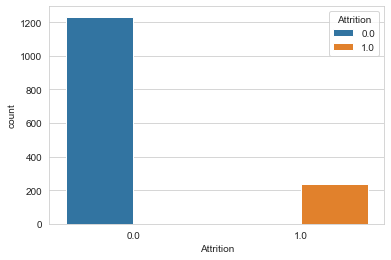

In [295]:
sns.countplot(df["Attrition"], hue="Attrition", data=df)
plt.show()

## 3. Missing values

In [19]:
df.isnull().sum()

Age                         0
Attrition                   0
BusinessTravel              0
DailyRate                   0
Department                  0
DistanceFromHome            0
Education                   0
EducationField              0
EmployeeCount               0
EmployeeNumber              0
EnvironmentSatisfaction     0
Gender                      0
HourlyRate                  0
JobInvolvement              0
JobLevel                    0
JobRole                     0
JobSatisfaction             0
MaritalStatus               0
MonthlyIncome               0
MonthlyRate                 0
NumCompaniesWorked          0
Over18                      0
OverTime                    0
PercentSalaryHike           0
PerformanceRating           0
RelationshipSatisfaction    0
StandardHours               0
StockOptionLevel            0
TotalWorkingYears           0
TrainingTimesLastYear       0
WorkLifeBalance             0
YearsAtCompany              0
YearsInCurrentRole          0
YearsSince

Perfect! we don't have any missing values.

## 4. Feature visualization and encoding

##### 4.1. Distribution of continuous features:

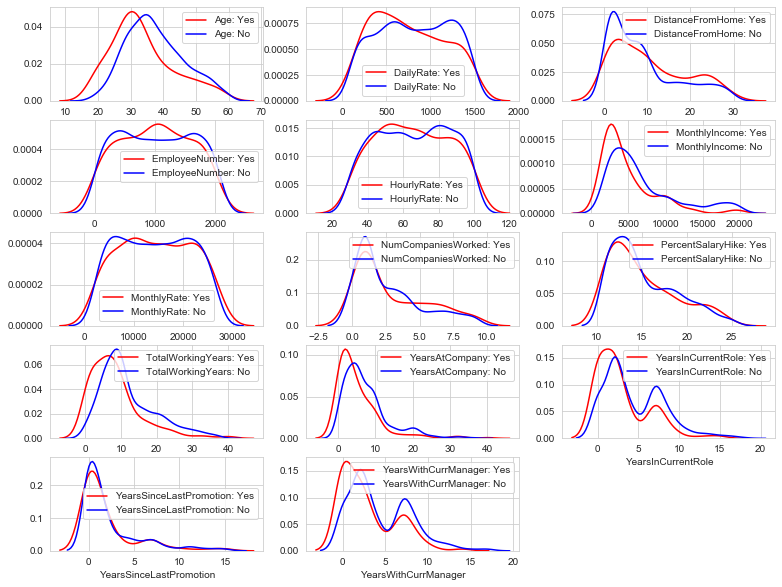

In [20]:
i=1
plt.figure(figsize=(13,10))
for col in num_col:
    plt.subplot(5,3, i)   # 5 row and 3 columns: we have 14 numeric features
    sns.distplot(df[col][df["Attrition"]=="Yes"], label=col +": Yes",color="r",hist=False )
    sns.distplot(df[col][df["Attrition"]=="No"], label=col+": No",color="b", hist=False)
    i=i+1

##### 4.2. Scatter plot of continuous features:

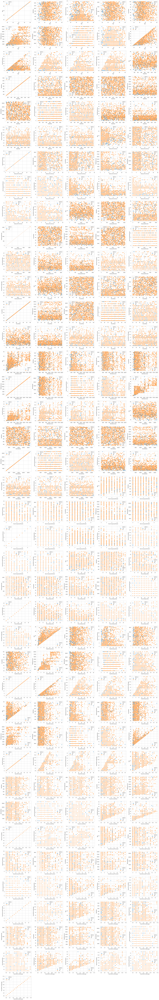

In [43]:
i=1
plt.figure(figsize=(30,200))
for col1 in num_col:
    for col2 in num_col: 
        plt.subplot(40,5, i)
        sns.scatterplot(x=col1, y=col2, data=df[num_col+["Attrition"]], hue="Attrition" )
        i=i+1

##### 4.3. Violinplot of continuous features

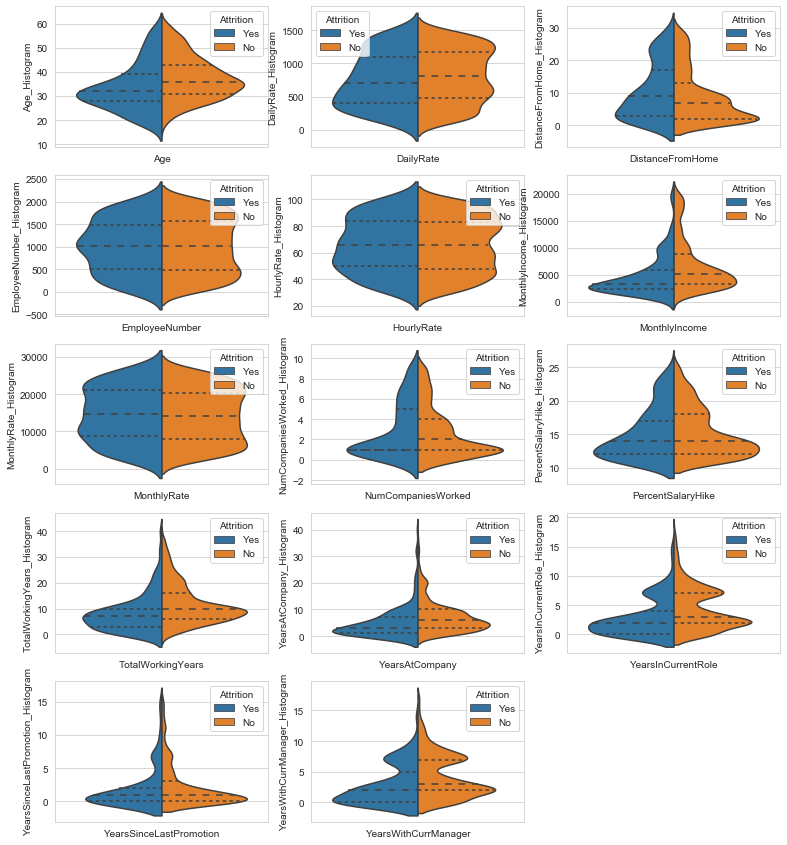

In [48]:
i=1
plt.figure(figsize=(13,15))
for col in num_col:
    plt.subplot(5,3, i)
    
    data=pd.melt(df[[col]+["Attrition"]], id_vars="Attrition",
    var_name="{}".format(""), value_name='{}_Histogram'.format(col))
    
    sns.violinplot(x="{}".format(""),y="{}_Histogram".format(col), data=data, hue="Attrition",split=True, inner="quart")
    i=i+1

##### 4.4. Swarmplot of continuous features:

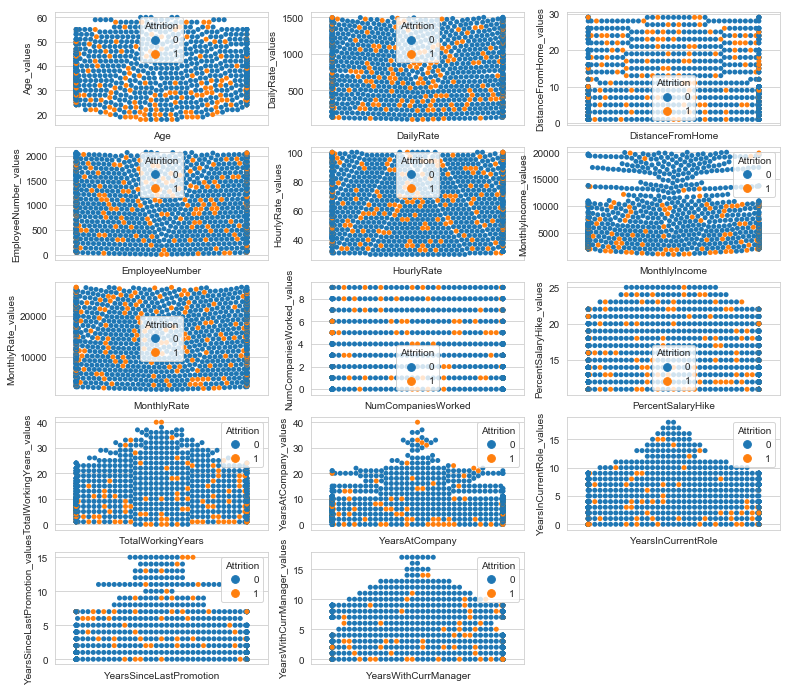

In [72]:
i=1
plt.figure(figsize=(13,12))
for col in num_col:
    plt.subplot(5,3, i)
    
    data=pd.melt(df[[col]+["Attrition"]], id_vars="Attrition",
    var_name="{}".format(""), value_name='{}_values'.format(col))
    
    sns.swarmplot(x="{}".format(""),y="{}_values".format(col), data=data, hue="Attrition")
    i=i+1

##### 4.5. Boxplot of continuous features:

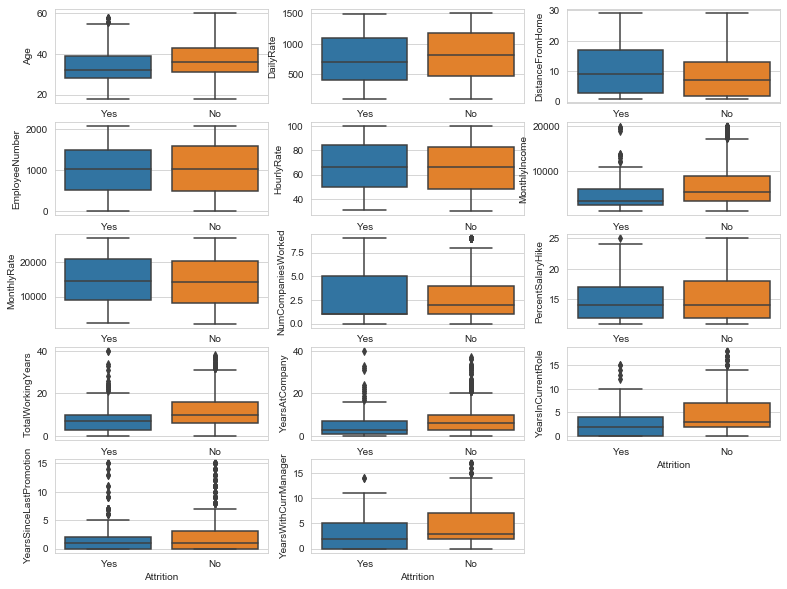

In [49]:
i=1
plt.figure(figsize=(13,10))
for col in num_col:
    plt.subplot(5,3, i)
    sns.boxplot(x="Attrition", y=col, data=df[num_col+["Attrition"]])
    i=i+1

##### 4.6. Countplot of categorical features:

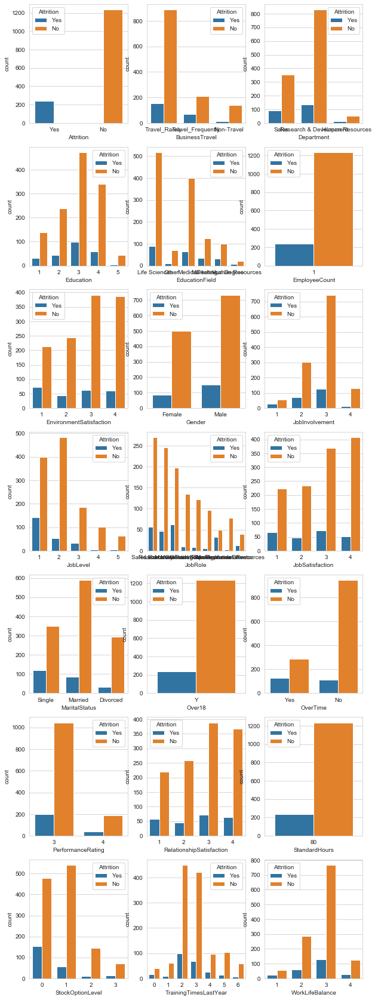

In [55]:
i=1
plt.figure(figsize=(10,30))
for col in cat_col:
    plt.subplot(7,3, i)  # we have 21 categorical features
    sns.countplot(df[col], hue=df["Attrition"])
    i=i+1

##### 4.7. Correlation with target

In [56]:
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()
df["Attrition"]=le.fit_transform(df["Attrition"])

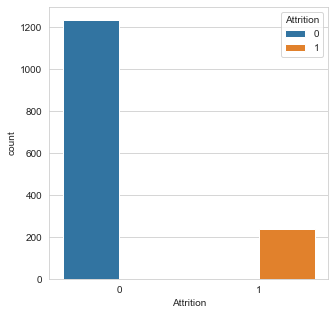

In [76]:
plt.figure(figsize=(5,5))
sns.countplot(df["Attrition"], hue="Attrition", data=df)
plt.show()

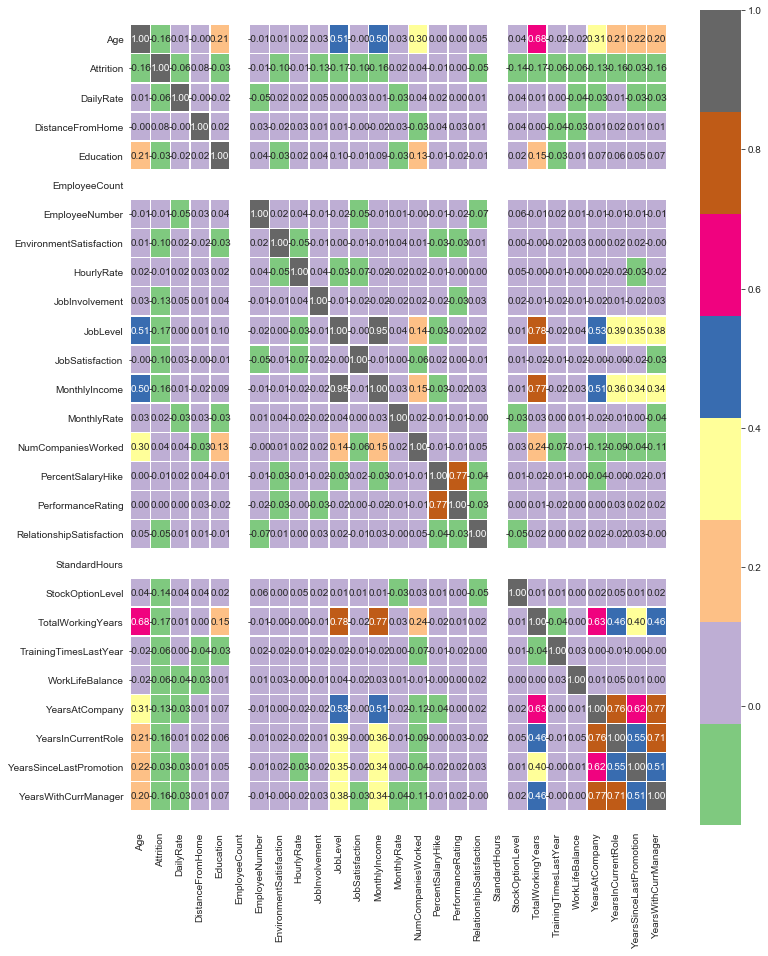

In [78]:
corr_matrix = df.corr()
fig, ax = plt.subplots(figsize=(12, 15))
ax = sns.heatmap(corr_matrix, annot=True, linewidths=0.5, fmt=".2f", cmap=plt.cm.Accent);
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)
plt.show()

##### Negative and positive correlations

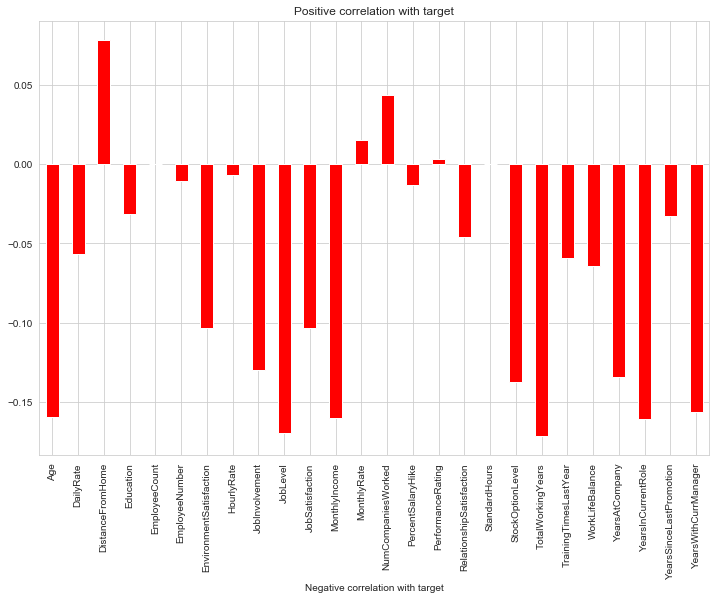

In [79]:
plt.figure(figsize=(5,3))
df.drop('Attrition', axis=1).corrwith(df.Attrition).plot(
    kind='bar', grid=True, figsize=(12, 8),title="Positive correlation with target", color="r")
plt.xlabel("Negative correlation with target")
plt.show()

##### 4.8. Categorical features encoding

In [80]:
cat_col.remove('Attrition')

df=pd.get_dummies(df, columns=cat_col).astype(float)

In [81]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 89 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Age                                1470 non-null   float64
 1   Attrition                          1470 non-null   float64
 2   DailyRate                          1470 non-null   float64
 3   DistanceFromHome                   1470 non-null   float64
 4   EmployeeNumber                     1470 non-null   float64
 5   HourlyRate                         1470 non-null   float64
 6   MonthlyIncome                      1470 non-null   float64
 7   MonthlyRate                        1470 non-null   float64
 8   NumCompaniesWorked                 1470 non-null   float64
 9   PercentSalaryHike                  1470 non-null   float64
 10  TotalWorkingYears                  1470 non-null   float64
 11  YearsAtCompany                     1470 non-null   float

## 5. Important features

In [83]:
X=df.drop("Attrition", axis=1)

y=df["Attrition"]

##### 5.1. Feature importance using permutation

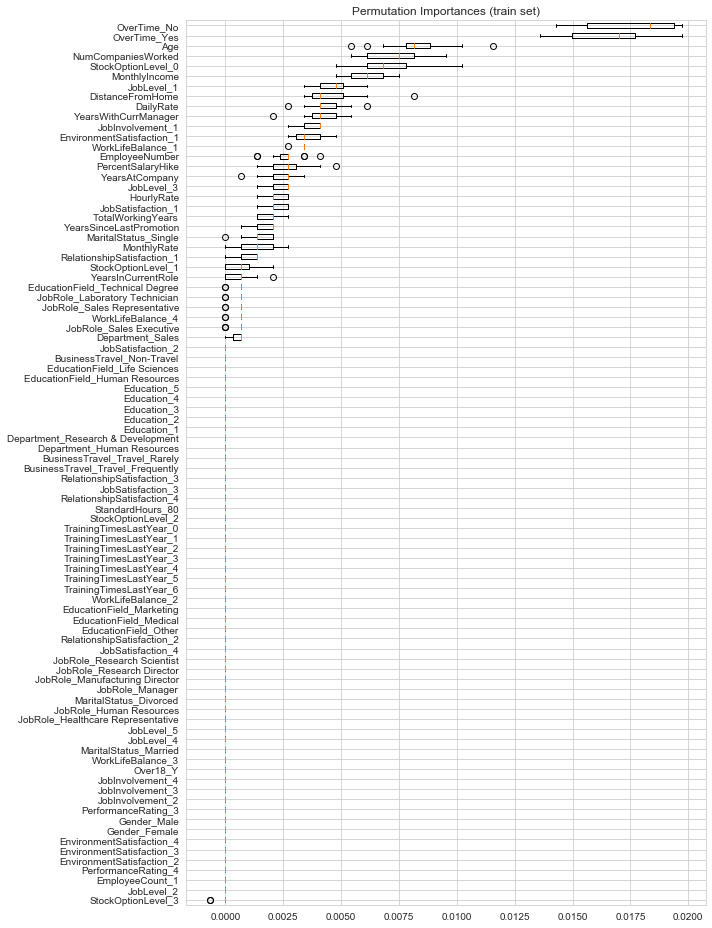

In [84]:
from sklearn.inspection import permutation_importance

rf=RandomForestClassifier()

rf.fit(X,y)

result = permutation_importance(rf, X, y, n_repeats=15,
                                random_state=42, n_jobs=2)
sorted_idx = result.importances_mean.argsort()

fig, ax = plt.subplots(figsize=(10,13))
ax.boxplot(result.importances[sorted_idx].T,
           vert=False, labels=X.columns[sorted_idx])
ax.set_title("Permutation Importances")
fig.tight_layout()
plt.show()

##### 5.2. Feature importance using random forest

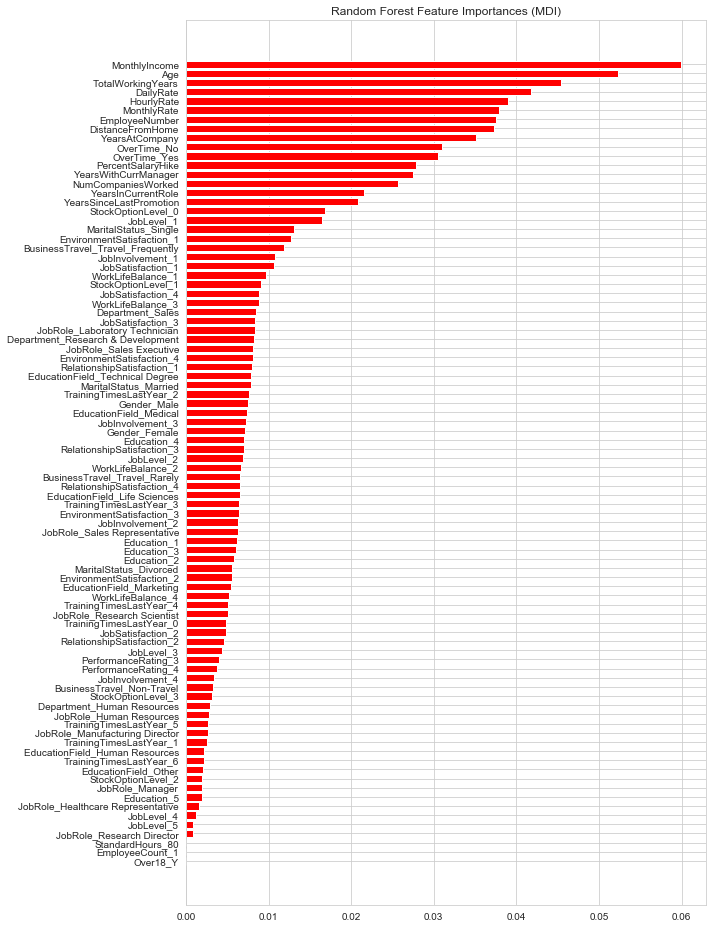

In [85]:
tree_feature_importances =rf.feature_importances_
sorted_idx = tree_feature_importances.argsort()

y_ticks = np.arange(0, len(list(X.columns)))
fig, ax = plt.subplots(figsize=(10,13))
ax.barh(y_ticks, tree_feature_importances[sorted_idx], color="r")
ax.set_yticklabels(X.columns[sorted_idx])
ax.set_yticks(y_ticks)
ax.set_title("Random Forest Feature Importances")
fig.tight_layout()
plt.show()

## 6. Train Test Split

In [86]:
X_train, X_test, y_train, y_test=train_test_split(X, y, test_size=0.3, stratify=y)

In [87]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1029 entries, 462 to 113
Data columns (total 88 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Age                                1029 non-null   float64
 1   DailyRate                          1029 non-null   float64
 2   DistanceFromHome                   1029 non-null   float64
 3   EmployeeNumber                     1029 non-null   float64
 4   HourlyRate                         1029 non-null   float64
 5   MonthlyIncome                      1029 non-null   float64
 6   MonthlyRate                        1029 non-null   float64
 7   NumCompaniesWorked                 1029 non-null   float64
 8   PercentSalaryHike                  1029 non-null   float64
 9   TotalWorkingYears                  1029 non-null   float64
 10  YearsAtCompany                     1029 non-null   float64
 11  YearsInCurrentRole                 1029 non-null   floa

## 7. Feature Scaling 

In [88]:
scaler=StandardScaler()

In [89]:
X_train[num_col]=scaler.fit_transform(X_train[num_col])

X_test[num_col]=scaler.fit_transform(X_test[num_col])

In [90]:
X_train.head(5)

,Age,DailyRate,DistanceFromHome,EmployeeNumber,HourlyRate,MonthlyIncome,MonthlyRate,NumCompaniesWorked,PercentSalaryHike,TotalWorkingYears,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,BusinessTravel_Non-Travel,BusinessTravel_Travel_Frequently,BusinessTravel_Travel_Rarely,Department_Human Resources,Department_Research & Development,Department_Sales,Education_1,Education_2,Education_3,Education_4,Education_5,EducationField_Human Resources,EducationField_Life Sciences,EducationField_Marketing,EducationField_Medical,EducationField_Other,EducationField_Technical Degree,EmployeeCount_1,EnvironmentSatisfaction_1,EnvironmentSatisfaction_2,EnvironmentSatisfaction_3,EnvironmentSatisfaction_4,Gender_Female,Gender_Male,JobInvolvement_1,JobInvolvement_2,JobInvolvement_3,JobInvolvement_4,JobLevel_1,JobLevel_2,JobLevel_3,JobLevel_4,JobLevel_5,JobRole_Healthcare Representative,JobRole_Human Resources,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative,JobSatisfaction_1,JobSatisfaction_2,JobSatisfaction_3,JobSatisfaction_4,MaritalStatus_Divorced,MaritalStatus_Married,MaritalStatus_Single,Over18_Y,OverTime_No,OverTime_Yes,PerformanceRating_3,PerformanceRating_4,RelationshipSatisfaction_1,RelationshipSatisfaction_2,RelationshipSatisfaction_3,RelationshipSatisfaction_4,StandardHours_80,StockOptionLevel_0,StockOptionLevel_1,StockOptionLevel_2,StockOptionLevel_3,TrainingTimesLastYear_0,TrainingTimesLastYear_1,TrainingTimesLastYear_2,TrainingTimesLastYear_3,TrainingTimesLastYear_4,TrainingTimesLastYear_5,TrainingTimesLastYear_6,WorkLifeBalance_1,WorkLifeBalance_2,WorkLifeBalance_3,WorkLifeBalance_4
462,-0.343507,-1.351947,1.437708,-0.641610,0.374368,-0.268819,0.836087,-0.704049,-0.869615,-0.176877,0.500025,0.775799,0.849695,0.812282,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1338,-0.779351,0.376356,-0.031775,1.445873,1.115944,-1.151925,0.280236,-0.704049,-0.594957,-1.338622,-0.980861,-1.167881,-0.686384,-1.159699,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
1074,-0.452468,-0.702890,-0.154231,0.845410,0.127175,-0.050740,1.139226,-0.302015,0.503672,0.339454,-1.145404,-1.167881,-0.686384,-1.159699,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
1256,0.092336,-0.506663,-0.888973,1.252926,0.423806,-0.864127,0.272258,0.502055,-0.320300,-0.305960,-0.158147,-0.890213,-0.686384,0.248859,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0
821,1.290906,-1.563268,-0.154231,0.218333,-0.515524,1.346127,-0.309519,1.306125,0.503672,1.372116,0.335482,1.053468,-0.071952,-0.314564,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


## 8. Dealing with Outliers (Only for train data)

In [91]:
def outliers_iqr(df):
    
    df["Attrition"]=y_train
    
    for col in num_col:
        quartile_1_0, quartile_3_0 = np.percentile(df[col][df["Attrition"]==0], [25, 75])
        
        iqr_0 = quartile_3_0 - quartile_1_0
        
        lower_bound_0 = quartile_1_0 - (iqr_0 * 1.5)
        
        upper_bound_0 = quartile_3_0 + (iqr_0 * 1.5)
        
        df[col].replace(df[col][(df["Attrition"]==0) & (df[col]> upper_bound_0)], upper_bound_0, inplace=True)
        
        df[col].replace(df[col][(df["Attrition"]==0) & (df[col]< lower_bound_0)],lower_bound_0, inplace=True)
        
        
        quartile_1_1, quartile_3_1 = np.percentile(df[col][df["Attrition"]==1], [25, 75])
        
        iqr_1= quartile_3_1 - quartile_1_1
        
        lower_bound_1 = quartile_1_1 - (iqr_1 * 1.5)
        
        upper_bound_1 = quartile_3_1 + (iqr_1 * 1.5)
        
        df[col].replace(df[col][(df["Attrition"]==1) & (df[col]> upper_bound_1)], upper_bound_1, inplace=True)
        
        
        df[col].replace(df[col][(df["Attrition"]==1) & (df[col]< lower_bound_1)],lower_bound_1, inplace=True)
    
    
    return df.drop("Attrition", axis=1)
    


In [92]:
X_train=outliers_iqr(X_train)

##### boxplots after replacing outliers:

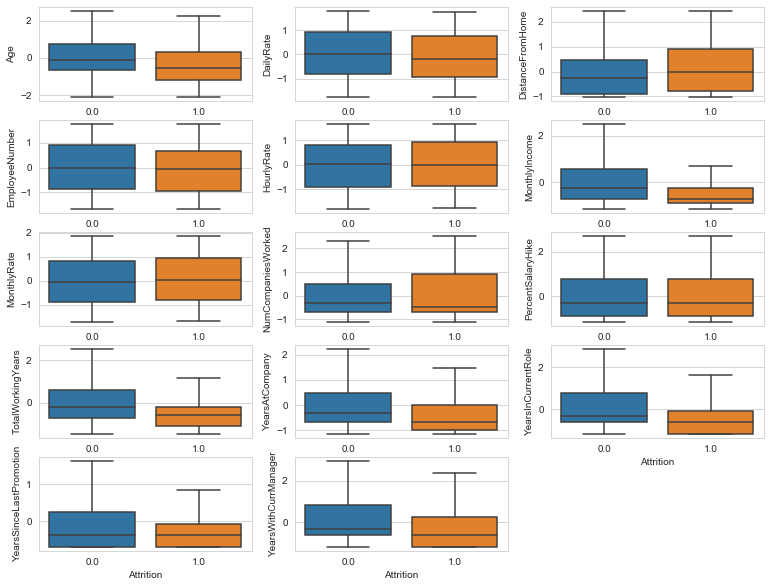

In [93]:
i=1
plt.figure(figsize=(13,10))
for col in num_col:
    plt.subplot(5,3, i)
    sns.boxplot(x="Attrition", y=col, data=pd.concat([X_train[num_col],y_train], axis=1))
    i=i+1

## 9. Final X_train, y_train  and uing PCA 

In [94]:
X_train.head(5)

,Age,DailyRate,DistanceFromHome,EmployeeNumber,HourlyRate,MonthlyIncome,MonthlyRate,NumCompaniesWorked,PercentSalaryHike,TotalWorkingYears,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,BusinessTravel_Non-Travel,BusinessTravel_Travel_Frequently,BusinessTravel_Travel_Rarely,Department_Human Resources,Department_Research & Development,Department_Sales,Education_1,Education_2,Education_3,Education_4,Education_5,EducationField_Human Resources,EducationField_Life Sciences,EducationField_Marketing,EducationField_Medical,EducationField_Other,EducationField_Technical Degree,EmployeeCount_1,EnvironmentSatisfaction_1,EnvironmentSatisfaction_2,EnvironmentSatisfaction_3,EnvironmentSatisfaction_4,Gender_Female,Gender_Male,JobInvolvement_1,JobInvolvement_2,JobInvolvement_3,JobInvolvement_4,JobLevel_1,JobLevel_2,JobLevel_3,JobLevel_4,JobLevel_5,JobRole_Healthcare Representative,JobRole_Human Resources,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative,JobSatisfaction_1,JobSatisfaction_2,JobSatisfaction_3,JobSatisfaction_4,MaritalStatus_Divorced,MaritalStatus_Married,MaritalStatus_Single,Over18_Y,OverTime_No,OverTime_Yes,PerformanceRating_3,PerformanceRating_4,RelationshipSatisfaction_1,RelationshipSatisfaction_2,RelationshipSatisfaction_3,RelationshipSatisfaction_4,StandardHours_80,StockOptionLevel_0,StockOptionLevel_1,StockOptionLevel_2,StockOptionLevel_3,TrainingTimesLastYear_0,TrainingTimesLastYear_1,TrainingTimesLastYear_2,TrainingTimesLastYear_3,TrainingTimesLastYear_4,TrainingTimesLastYear_5,TrainingTimesLastYear_6,WorkLifeBalance_1,WorkLifeBalance_2,WorkLifeBalance_3,WorkLifeBalance_4
462,-0.343507,-1.351947,1.437708,-0.641610,0.374368,-0.268819,0.836087,-0.704049,-0.869615,-0.176877,0.500025,0.775799,0.849695,0.812282,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1338,-0.779351,0.376356,-0.031775,1.445873,1.115944,-1.151925,0.280236,-0.704049,-0.594957,-1.338622,-0.980861,-1.167881,-0.686384,-1.159699,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
1074,-0.452468,-0.702890,-0.154231,0.845410,0.127175,-0.050740,1.139226,-0.302015,0.503672,0.339454,-1.145404,-1.167881,-0.686384,-1.159699,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
1256,0.092336,-0.506663,-0.888973,1.252926,0.423806,-0.864127,0.272258,0.502055,-0.320300,-0.305960,-0.158147,-0.890213,-0.686384,0.248859,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0
821,1.290906,-1.563268,-0.154231,0.218333,-0.515524,1.346127,-0.309519,1.306125,0.503672,1.372116,0.335482,1.053468,-0.071952,-0.314564,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [95]:
X_test.head(5)

,Age,DailyRate,DistanceFromHome,EmployeeNumber,HourlyRate,MonthlyIncome,MonthlyRate,NumCompaniesWorked,PercentSalaryHike,TotalWorkingYears,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,BusinessTravel_Non-Travel,BusinessTravel_Travel_Frequently,BusinessTravel_Travel_Rarely,Department_Human Resources,Department_Research & Development,Department_Sales,Education_1,Education_2,Education_3,Education_4,Education_5,EducationField_Human Resources,EducationField_Life Sciences,EducationField_Marketing,EducationField_Medical,EducationField_Other,EducationField_Technical Degree,EmployeeCount_1,EnvironmentSatisfaction_1,EnvironmentSatisfaction_2,EnvironmentSatisfaction_3,EnvironmentSatisfaction_4,Gender_Female,Gender_Male,JobInvolvement_1,JobInvolvement_2,JobInvolvement_3,JobInvolvement_4,JobLevel_1,JobLevel_2,JobLevel_3,JobLevel_4,JobLevel_5,JobRole_Healthcare Representative,JobRole_Human Resources,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative,JobSatisfaction_1,JobSatisfaction_2,JobSatisfaction_3,JobSatisfaction_4,MaritalStatus_Divorced,MaritalStatus_Married,MaritalStatus_Single,Over18_Y,OverTime_No,OverTime_Yes,PerformanceRating_3,PerformanceRating_4,RelationshipSatisfaction_1,RelationshipSatisfaction_2,RelationshipSatisfaction_3,RelationshipSatisfaction_4,StandardHours_80,StockOptionLevel_0,StockOptionLevel_1,StockOptionLevel_2,StockOptionLevel_3,TrainingTimesLastYear_0,TrainingTimesLastYear_1,TrainingTimesLastYear_2,TrainingTimesLastYear_3,TrainingTimesLastYear_4,TrainingTimesLastYear_5,TrainingTimesLastYear_6,WorkLifeBalance_1,WorkLifeBalance_2,WorkLifeBalance_3,WorkLifeBalance_4
1307,-0.931913,0.956026,-1.010181,1.275649,0.115212,-0.590826,-0.302019,-0.619485,2.620228,-1.028258,-0.660839,-0.622413,-0.343900,-0.592880,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1459,-0.820839,1.342782,0.498249,1.639960,-0.909744,-0.492563,1.199957,0.573497,-0.624857,-0.136118,-0.500360,-0.349837,-0.662512,-0.315616,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1227,-0.598691,-0.187427,-0.884478,1.087671,0.212827,-0.616637,0.435813,-0.619485,-0.354433,-0.645912,-0.339881,-0.622413,-0.662512,-0.315616,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
419,-0.709765,1.395631,-0.758776,-0.840349,-0.568092,-0.929085,0.248203,0.573497,-0.084009,-0.263567,-0.339881,-0.349837,-0.343900,-0.038352,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
1425,-0.376543,-0.763958,0.749654,1.566765,1.481820,-0.299434,0.922310,-1.017145,-0.624857,-0.136118,0.302035,0.740468,1.886390,-0.870144,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0


In [96]:
y_train.head(5)

462     0.0
1338    1.0
1074    0.0
1256    0.0
821     0.0
Name: Attrition, dtype: float64

In [97]:
y_test.head(5)

1307    0.0
1459    0.0
1227    0.0
419     0.0
1425    0.0
Name: Attrition, dtype: float64

##### 9.1. PCA

In [101]:
pca=PCA(n_components=2)

In [102]:
X_pca=pca.fit_transform(X_train)

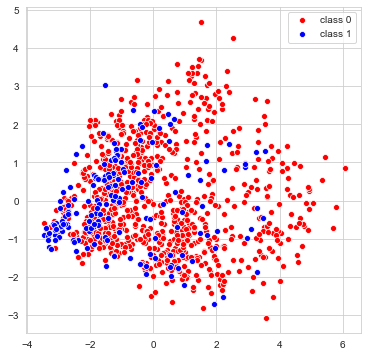

In [103]:
plt.figure(figsize=(6,6))
sns.scatterplot(X_pca[y_train==0, 0], X_pca[y_train==0,1], color="r",label="class 0")
sns.scatterplot(X_pca[y_train==1, 0], X_pca[y_train==1,1], color="b", label="class 1")

plt.show()

## 10. Modeling

##### 10.1. Metrics:

In [104]:
def my_f1(y_true, y_pred):
    return f1_score(y_true, y_pred, pos_label=1, zero_division=0)


def my_roc(y_true, y_pred):
    return roc_auc_score(y_true, y_pred)   

In [105]:
score_f1=make_scorer(my_f1, greater_is_better=True)

score_roc=make_scorer(my_roc, greater_is_better=True)

### 10.2. Support vector machine classifier

In [113]:
pipe=Pipeline([
("feature_selection", PCA()),
("normal", QuantileTransformer(output_distribution="normal")),
("classifier", SVC())
])


bayes_cv_sv = BayesSearchCV(pipe,
    search_spaces = {
        
        "classifier__kernel":Categorical(['linear', 'poly', 'rbf', 'sigmoid']),
        'classifier__C': Real(1e-6, 1e+2,prior='log-uniform'),
        "classifier__gamma":Real(1e-6, 1e+2,prior='log-uniform'),
        'classifier__degree': Integer(1,10),
        'classifier__coef0': Real(1e-6, 1e+2, prior='log-uniform'),
        
        'classifier__tol': Real(1e-6, 1e+2,prior='log-uniform'),
        "classifier__class_weight":Categorical(["balanced", None]),
        
        "feature_selection__n_components": Integer(5,50),
        "feature_selection__tol": Real(0,10)
    },
    scoring =score_f1,
    cv =StratifiedKFold(
        n_splits=5, 
        random_state=1042
    ),
    refit=True,
    optimizer_kwargs={'base_estimator': 'GP'},
    n_jobs = -1,
    n_iter = 40,
    n_points=5,
    verbose = 0,
    random_state = 1042
)


print( "The number of iterations:", bayes_cv_sv.total_iterations)

The number of iterations: 360


In [114]:
bayes_cv_sv.fit(X_train, y_train)

bayes_cv_sv.best_score_

0.5191303227985188

In [115]:
model_sv=bayes_cv_sv.best_estimator_

In [116]:
model_sv

Pipeline(memory=None,
         steps=[('feature_selection',
                 PCA(copy=True, iterated_power='auto', n_components=50,
                     random_state=None, svd_solver='auto', tol=10.0,
                     whiten=False)),
                ('classifier',
                 SVC(C=15.189444500345859, break_ties=False, cache_size=200,
                     class_weight='balanced', coef0=100.0,
                     decision_function_shape='ovr', degree=10, gamma=100.0,
                     kernel='linear', max_iter=-1, probability=False,
                     random_state=None, shrinking=True, tol=1e-06,
                     verbose=False))],
         verbose=False)

In [117]:
y_pred_sv=model_sv.predict(X_test)

In [118]:
print(classification_report(y_test, y_pred_sv))

              precision    recall  f1-score   support

         0.0       0.94      0.76      0.84       370
         1.0       0.38      0.76      0.51        71

    accuracy                           0.76       441
   macro avg       0.66      0.76      0.68       441
weighted avg       0.85      0.76      0.79       441



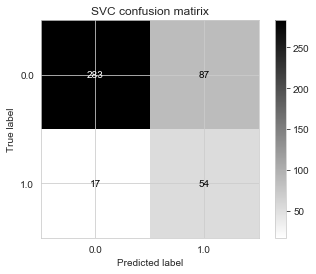

In [120]:
disp=plot_confusion_matrix(model_sv, X_test, y_test, cmap=plt.cm.binary, values_format=".3g")
disp.ax_.set_title("SVC confusion matirix")
plt.show()

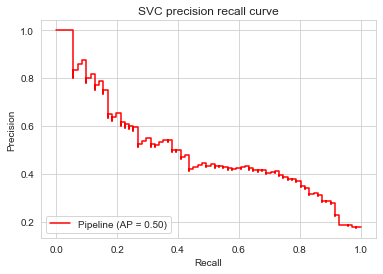

In [121]:
disp=plot_precision_recall_curve(model_sv, X_test, y_test, color="r")
disp.ax_.set_title("SVC precision recall curve")
plt.show()

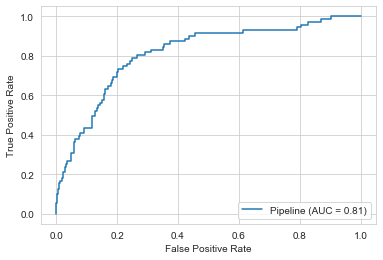

In [122]:
plot_roc_curve(model_sv, X_test, y_test)
disp.ax_.set_title("SVC roc curve")
plt.show()

In [123]:
pd.DataFrame(bayes_cv_sv.cv_results_).head(5)

,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_classifier__C,param_classifier__class_weight,param_classifier__coef0,param_classifier__degree,param_classifier__gamma,param_classifier__kernel,param_classifier__tol,param_feature_selection__n_components,param_feature_selection__tol,params
0,0.276151,0.276151,0.276151,0.00,0.277311,0.221098,0.110617,32,0.060468,0.009662,0.009927,0.000862,0.000059,balanced,0.425078,4,0.000047,poly,0.014515,17,3.423162,"{'classifier__C': 5.884762689272744e-05, 'clas..."
1,0.511628,0.461538,0.470588,0.44,0.584270,0.493517,0.050890,21,0.077509,0.031276,0.007520,0.000317,0.143127,balanced,13.247663,7,0.007670,linear,0.000196,26,5.544830,"{'classifier__C': 0.14312666893075754, 'classi..."
2,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,35,0.058055,0.013906,0.006116,0.000585,0.000983,None,0.000003,8,69.741491,linear,0.000003,23,2.414591,"{'classifier__C': 0.0009831890356622331, 'clas..."
3,0.276151,0.276151,0.276151,0.00,0.277311,0.221098,0.110617,32,0.065275,0.014364,0.020454,0.008552,0.000009,balanced,0.125905,7,0.001358,rbf,0.000042,11,0.267570,"{'classifier__C': 8.639649555374242e-06, 'clas..."
4,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,35,0.020457,0.003374,0.004609,0.000492,0.000823,None,0.046658,4,0.006234,linear,0.816374,9,5.572208,"{'classifier__C': 0.0008232180435406374, 'clas..."


#### 10.3. Logistic Regression

In [124]:
from sklearn.linear_model import LogisticRegression

In [133]:
pipe_lg=Pipeline([
    ("feature_selection",FactorAnalysis()),
    ("normal", QuantileTransformer(output_distribution="normal")),
    ("classifier", LogisticRegression(solver='liblinear'))
])



bayes_cv_lg = BayesSearchCV(estimator =pipe_lg,
    search_spaces = {
        'classifier__l1_ratio': Real(1e-6, 1e+2,'log-uniform'),
        
        'classifier__max_iter': Integer(10,100),
        
        'classifier__C': Real(1e-9, 1e+2),
        
        'classifier__tol': Real(1e-9, 1),
        
        "classifier__penalty":Categorical(["l2", "l1"]),
        
        "classifier__class_weight": Categorical(['balanced',None]),
        
        "feature_selection__n_components":Integer(5,40)
    },
    scoring = score_f1,
    cv = StratifiedKFold(
        n_splits=5,
        shuffle=True,
        random_state=42
    ),
    n_jobs = -1,
    n_iter = 30, 
    n_points=5,
    optimizer_kwargs={'base_estimator': 'GP'},
    verbose = 0,
    refit = True,
    random_state = 1042
)


print( "The number of iterations:", bayes_cv_lg.total_iterations)

The number of iterations: 210


In [134]:
bayes_cv_lg.fit(X_train, y_train)

bayes_cv_lg.best_score_

0.5219017724591383

In [135]:
pd.DataFrame(bayes_cv_lg.cv_results_).head(5)

,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_classifier__C,param_classifier__class_weight,param_classifier__l1_ratio,param_classifier__max_iter,param_classifier__penalty,param_classifier__tol,param_feature_selection__n_components,params
0,0.500000,0.435644,0.476190,0.444444,0.461538,0.463565,0.022973,15,1.726528,0.091677,0.004813,0.000512,22.121612,balanced,0.425078,45,l2,0.460403,23,"{'classifier__C': 22.121611926296413, 'classif..."
1,0.509091,0.440000,0.477064,0.439024,0.457143,0.464472,0.026278,14,1.670969,0.105866,0.009025,0.004476,26.866079,balanced,0.143127,49,l1,0.627140,22,"{'classifier__C': 26.866079334902576, 'classif..."
2,0.478632,0.372549,0.403846,0.471910,0.400000,0.425412,0.042203,23,0.643418,0.056169,0.007619,0.005729,10.540741,balanced,0.005500,60,l2,0.579565,7,"{'classifier__C': 10.54074117505408, 'classifi..."
3,0.355556,0.263158,0.472727,0.409091,0.461538,0.392347,0.076913,24,0.693166,0.068120,0.006718,0.001695,77.589719,None,0.000003,16,l2,0.241459,9,"{'classifier__C': 77.5897189974936, 'classifie..."
4,0.363636,0.263158,0.400000,0.372093,0.461538,0.371998,0.064341,25,0.509767,0.155972,0.004011,0.001648,2.984323,None,0.402163,45,l1,0.202656,9,"{'classifier__C': 2.984322805902906, 'classifi..."


In [140]:
model_lg=bayes_cv_lg.best_estimator_

In [141]:
model_lg.get_params

<bound method Pipeline.get_params of Pipeline(memory=None,
         steps=[('feature_selection',
                 FactorAnalysis(copy=True, iterated_power=3, max_iter=1000,
                                n_components=40, noise_variance_init=None,
                                random_state=0, svd_method='randomized',
                                tol=0.01)),
                ('classifier',
                 LogisticRegression(C=83.32399185406574, class_weight=None,
                                    dual=False, fit_intercept=True,
                                    intercept_scaling=1, l1_ratio=1e-06,
                                    max_iter=58, multi_class='auto',
                                    n_jobs=None, penalty='l1',
                                    random_state=None, solver='liblinear',
                                    tol=0.4546094652006988, verbose=0,
                                    warm_start=False))],
         verbose=False)>

In [142]:
y_pred_lg=model_lg.predict(X_test)

In [143]:
print(classification_report(y_test, y_pred_lg))

              precision    recall  f1-score   support

         0.0       0.89      0.96      0.93       370
         1.0       0.68      0.38      0.49        71

    accuracy                           0.87       441
   macro avg       0.78      0.67      0.71       441
weighted avg       0.86      0.87      0.86       441



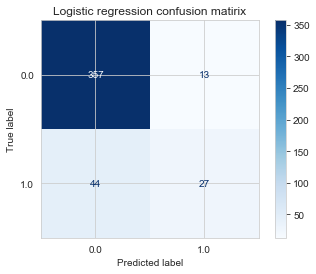

In [144]:
disp=plot_confusion_matrix(model_lg, X_test, y_test, cmap=plt.cm.Blues, values_format=".3g")
disp.ax_.set_title("Logistic regression confusion matirix")
plt.show()

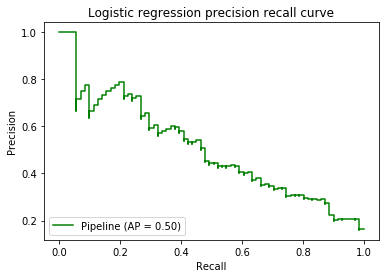

In [480]:
disp=plot_precision_recall_curve(model_lg, X_test, y_test, color="g")
disp.ax_.set_title("Logistic regression precision recall curve")
plt.show()

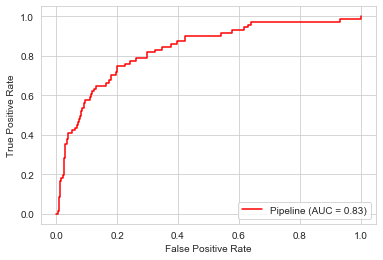

In [145]:
plot_roc_curve(model_lg, X_test, y_test, color="r")
disp.ax_.set_title("Logistic regression roc curve")
plt.show()

#### 10.4. Quadratic Discriminant Analysis

In [146]:
pipe_qd=Pipeline([
    ("feature_selection",KernelPCA()),
    ("normal", QuantileTransformer(output_distribution="normal")),
    ("classifier", QuadraticDiscriminantAnalysis())
])



bayes_cv_qd = BayesSearchCV(estimator =pipe_qd,
    search_spaces = {
        
        'classifier__reg_param': Real(1e-9, 1e+2),
        
        'classifier__tol': Real(1e-9, 1),
        
        "feature_selection__n_components":Integer(5,50),
        
        "feature_selection__kernel": Categorical(["linear", "poly","rbf", "sigmoid", "cosine"]),
        
        "feature_selection__degree":Integer(1,20),
        
        "feature_selection__coef0":Real(1,10),
        
        "feature_selection__alpha":Real(1e-6, 1e+2),
        
        "feature_selection__tol":Real(1e-6, 1e+2)
        
    },
    scoring = score_f1,
    cv = StratifiedKFold(
        n_splits=5,
        shuffle=True,
        random_state=42
    ),
    n_jobs = 4,
    n_iter = 30, 
    optimizer_kwargs={'base_estimator': 'GP'},
    verbose = 0,
    refit = True,
    random_state = 42
)


print( "The number of iterations:", bayes_cv_qd.total_iterations)

The number of iterations: 240


In [147]:
bayes_cv_qd.fit(X_train, y_train)

bayes_cv_qd.best_score_

0.452654755342549

In [148]:
model_qd=bayes_cv_qd.best_estimator_

In [149]:
model_qd

Pipeline(memory=None,
         steps=[('feature_selection',
                 KernelPCA(alpha=74.12827469551999, coef0=3.290988320776404,
                           copy_X=True, degree=12, eigen_solver='auto',
                           fit_inverse_transform=False, gamma=None,
                           kernel='poly', kernel_params=None, max_iter=None,
                           n_components=19, n_jobs=None, random_state=None,
                           remove_zero_eig=False, tol=15.259459531249844)),
                ('normal',
                 QuantileTransformer(copy=True, ignore_implicit_zeros=False,
                                     n_quantiles=1000,
                                     output_distribution='normal',
                                     random_state=None, subsample=100000)),
                ('classifier',
                 QuadraticDiscriminantAnalysis(priors=None,
                                               reg_param=0.3630307264706924,
                        

In [150]:
y_pred_qd=model_qd.predict(X_test)

In [151]:
print(classification_report(y_test, y_pred_qd))

              precision    recall  f1-score   support

         0.0       0.88      0.91      0.90       370
         1.0       0.45      0.37      0.40        71

    accuracy                           0.83       441
   macro avg       0.67      0.64      0.65       441
weighted avg       0.81      0.83      0.82       441



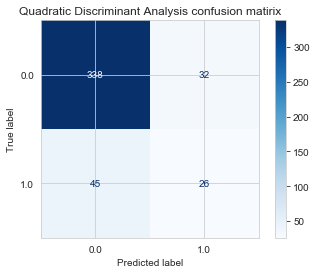

In [154]:
disp=plot_confusion_matrix(model_qd, X_test, y_test, cmap=plt.cm.Blues, values_format=".3g")
disp.ax_.set_title("Quadratic Discriminant Analysis confusion matirix")
plt.show()

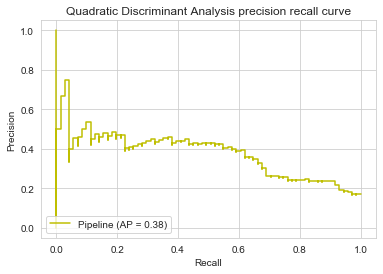

In [155]:
disp=plot_precision_recall_curve(model_qd, X_test, y_test, color="y")
disp.ax_.set_title("Quadratic Discriminant Analysis precision recall curve")
plt.show()

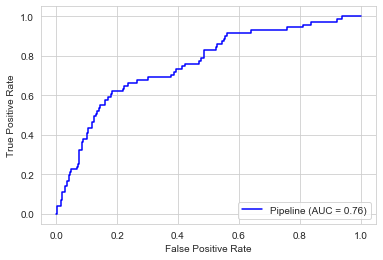

In [156]:
plot_roc_curve(model_qd, X_test, y_test, color="b")
disp.ax_.set_title("Quadratic Discriminant Analysis roc curve")
plt.show()

#### 10.5. Extra Tree Classifier

In [157]:
from sklearn.tree import ExtraTreeClassifier

In [158]:
pipe_ex=Pipeline([
    ("feature_selection", SelectKBest()),
    ("classifier", ExtraTreeClassifier())
])

bayes_cv_ex = BayesSearchCV(estimator =pipe_ex,
    search_spaces = {
        
        'classifier__max_depth': Integer(1,10),
        
        'classifier__max_leaf_nodes': Integer(2,20),
        
        'classifier__min_impurity_decrease': Real(1e-9, 1),
        
        'classifier__min_impurity_split': Real(1e-9, 1),
        
        'classifier__min_weight_fraction_leaf': Real(1e-9, 0.5),
        
        'classifier__min_samples_leaf': Integer(1,5),
        
        
        'classifier__min_samples_split': Integer(2,5),
        
        'classifier__ccp_alpha': Real(1e-9, 1e+2),
        
        
        "classifier__criterion":Categorical(["gini", "entropy"]),
        
        "classifier__splitter": Categorical(["random", "best"]),
        
      "classifier__class_weight":Categorical(["balanced", None]),
       
        
        "feature_selection__k":Integer(5,50)
    },
    scoring = score_f1,
    cv = StratifiedKFold(
        n_splits=5,
        shuffle=True,
        random_state=42
    ),
    n_jobs = -1,
    n_iter = 20, 
    optimizer_kwargs={'base_estimator': 'GP'},
    verbose = 0,
    refit = True,
    random_state = 42
)

print( "The number of iterations:", bayes_cv_ex.total_iterations)

The number of iterations: 240


In [159]:
bayes_cv_ex.fit(X_train, y_train)

bayes_cv_ex.best_score_

0.4532745730109302

In [160]:
model_ex=bayes_cv_ex.best_estimator_

In [161]:
model_ex

Pipeline(memory=None,
         steps=[('feature_selection',
                 SelectKBest(k=5,
                             score_func=<function f_classif at 0x00000159B013A5E8>)),
                ('classifier',
                 ExtraTreeClassifier(ccp_alpha=1e-09, class_weight='balanced',
                                     criterion='gini', max_depth=10,
                                     max_features='auto', max_leaf_nodes=20,
                                     min_impurity_decrease=1e-09,
                                     min_impurity_split=1e-09,
                                     min_samples_leaf=1, min_samples_split=5,
                                     min_weight_fraction_leaf=1e-09,
                                     random_state=None, splitter='best'))],
         verbose=False)

In [162]:
y_pred_ex=model_ex.predict(X_test)

In [163]:
print(classification_report(y_test, y_pred_ex))

              precision    recall  f1-score   support

         0.0       0.91      0.74      0.82       370
         1.0       0.32      0.62      0.42        71

    accuracy                           0.72       441
   macro avg       0.61      0.68      0.62       441
weighted avg       0.81      0.72      0.75       441



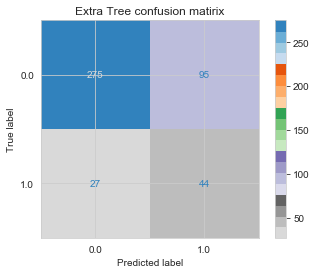

In [164]:
disp=plot_confusion_matrix(model_ex, X_test, y_test, cmap=plt.cm.cmapname, values_format=".3g")
disp.ax_.set_title("Extra Tree confusion matirix")
plt.show()

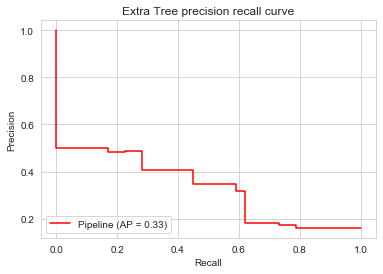

In [165]:
disp=plot_precision_recall_curve(model_ex, X_test, y_test, color="r")
disp.ax_.set_title("Extra Tree precision recall curve")
plt.show()

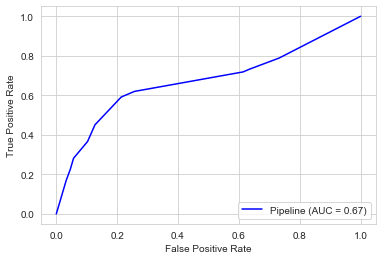

In [166]:
plot_roc_curve(model_ex, X_test, y_test, color="b")
disp.ax_.set_title("Extra Tree roc curve")
plt.show()

### 10. 6. Xgboost classifier

In [175]:
pipe_xg=Pipeline([
    ("feature_selection",SelectFromModel(estimator=LogisticRegression(penalty="l1", 
                                                                      solver='liblinear' ))),
    ("classifier", XGBClassifier())
])



bayes_cv_xg = BayesSearchCV(estimator =pipe_xg,
    search_spaces = {
        "classifier__base_score":Real(0.1,0.9),
        'classifier__learning_rate': Real(1e-6, 1e+1,'log-uniform'),
        'classifier__min_child_weight': Real(1, 10,'uniform'),
        'classifier__max_depth': Integer(2,10),
        'classifier__max_delta_step': Integer(1, 10),
        'classifier__subsample': Real(0.01, 1.0, 'uniform'),
        'classifier__colsample_bytree': Real(0.01, 1.0, 'uniform'),
        'classifier__colsample_bylevel': Real(0.01, 1.0, 'uniform'),
        'classifier__reg_lambda': Real(1e-6, 10),
        'classifier__reg_alpha': Real(1e-6, 1.0),
        'classifier__gamma': Real(1e-6, 1e+2, 'log-uniform'),
        'classifier__min_child_weight': Integer(0, 100),
        'classifier__n_estimators': Integer(10, 200),
        'classifier__scale_pos_weight': Real(1e-6, 100),
        "classifier__booster":Categorical(["gbtree", "gblinear", "dart"]),
        "classifier__importance_type": Categorical(["gain","weight","cover","total_gain",
                                                    "total_cover"])

    },
    scoring = score_f1,
    cv = StratifiedKFold(
        n_splits=5,
        shuffle=True,
        random_state=42
    ),
    n_jobs = -1,
    n_iter = 30,
    n_points=5,
    verbose = 0,
    refit = True,
    random_state = 42
)


print( "The number of iterations:", bayes_cv_xg.total_iterations)

The number of iterations: 450


In [176]:
bayes_cv_xg.fit(X_train, y_train)

bayes_cv_xg.best_score_

0.4906141877778458

In [177]:
model_xg=bayes_cv_xg.best_estimator_

In [178]:
model_xg

Pipeline(memory=None,
         steps=[('feature_selection',
                 SelectFromModel(estimator=LogisticRegression(C=1.0,
                                                              class_weight=None,
                                                              dual=False,
                                                              fit_intercept=True,
                                                              intercept_scaling=1,
                                                              l1_ratio=None,
                                                              max_iter=100,
                                                              multi_class='auto',
                                                              n_jobs=None,
                                                              penalty='l1',
                                                              random_state=None,
                                                              solver='liblinear',
  

In [179]:
y_pred_xg=model_xg.predict(X_test)

In [180]:
print(classification_report(y_test, y_pred_xg))

              precision    recall  f1-score   support

         0.0       0.89      0.88      0.89       370
         1.0       0.43      0.45      0.44        71

    accuracy                           0.81       441
   macro avg       0.66      0.67      0.66       441
weighted avg       0.82      0.81      0.82       441



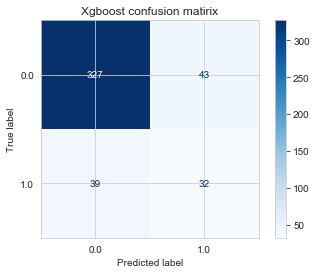

In [181]:
disp=plot_confusion_matrix(model_xg, X_test, y_test, cmap=plt.cm.Blues, values_format=".3g")
disp.ax_.set_title("Xgboost confusion matirix")
plt.show()

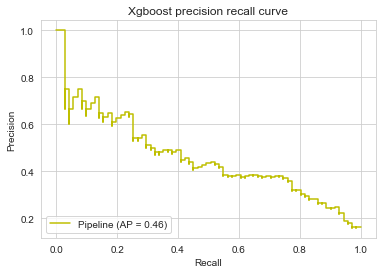

In [182]:
disp=plot_precision_recall_curve(model_xg, X_test, y_test, color="y")
disp.ax_.set_title("Xgboost precision recall curve")
plt.show()

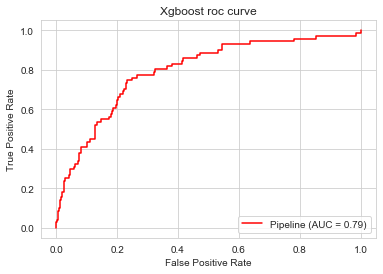

In [183]:
disp=plot_roc_curve(model_xg, X_test, y_test, color="r")
disp.ax_.set_title("Xgboost roc curve")
plt.show()

### 10.7. Light GBM

In [184]:
from lightgbm import LGBMClassifier

In [186]:
pipe_lgb=Pipeline([
   #("feature_selection",RFECV(estimator=LGBMClassifier(),
                              # step=1, cv=StratifiedKFold(2),scoring=score_f1)),
    ("classifier", LGBMClassifier())
])



bayes_cv_lgb = BayesSearchCV(estimator =pipe_lgb,
    search_spaces ={
    'classifier__boosting_type': Categorical(['gbdt','dart','goss']),
                            
          'classifier__num_leaves': Integer(3,20),
              
        "classifier__importance_type":Categorical(['split','gain']),
              
          "classifier__n_estimators":Integer(10,200),
        
           "classifier__max_depth":Integer(3,20),
           
          'classifier__learning_rate':Real(1e-6,100),
            
         "classifier__class_weight": Categorical(['balanced' , None]),
              
          'classifier__max_bin': Integer(5, 20),
              
          'classifier__subsample_for_bin':Integer(10,2000),
          
          'classifier__colsample_bytree': Real(1e-6, 9e-1),
              
          'classifier__reg_alpha':Real(1e-6, 1e+2, prior="log-uniform"),
              
         'classifier__reg_lambda':Real(1e-6, 1e+1, prior="log-uniform"),
              
          'classifier__min_split_gain':Real(1e-6, 1e+2, prior="log-uniform"),
              
          'classifier__min_child_weight': Real(1e-6, 1e+2, prior="log-uniform"),
              
          'classifier__min_child_samples':Integer(1,10)
    },
    scoring = score_f1,
    cv = StratifiedKFold(
        n_splits=5,
        shuffle=True,
        random_state=42
    ),
    n_jobs = -1,
    n_iter = 30,  
    n_points=5,
    verbose = 0,
    refit = True,
    random_state = 42
)

print( "The number of iterations:", bayes_cv_lgb.total_iterations)

The number of iterations: 450


In [187]:
bayes_cv_lgb.fit(X_train, y_train)

bayes_cv_lgb.best_score_

0.4837634474050335

In [188]:
model_lgb=bayes_cv_lgb.best_estimator_

In [189]:
model_lgb

Pipeline(memory=None,
         steps=[('classifier',
                 LGBMClassifier(boosting_type='gbdt', class_weight='balanced',
                                colsample_bytree=0.43969052732329855,
                                importance_type='gain',
                                learning_rate=83.87367897145994, max_bin=10,
                                max_depth=7, min_child_samples=1,
                                min_child_weight=1.183004154913146e-06,
                                min_split_gain=0.9156916357310556,
                                n_estimators=199, n_jobs=-1, num_leaves=16,
                                objective=None, random_state=None,
                                reg_alpha=1.1284075885484703e-05,
                                reg_lambda=0.00026991426342492175, silent=True,
                                subsample=1.0, subsample_for_bin=98,
                                subsample_freq=0))],
         verbose=False)

In [190]:
y_pred_lgb=model_lgb.predict(X_test)

In [191]:
print(classification_report(y_test,y_pred_lgb))

              precision    recall  f1-score   support

         0.0       0.91      0.72      0.80       370
         1.0       0.30      0.62      0.40        71

    accuracy                           0.71       441
   macro avg       0.60      0.67      0.60       441
weighted avg       0.81      0.71      0.74       441



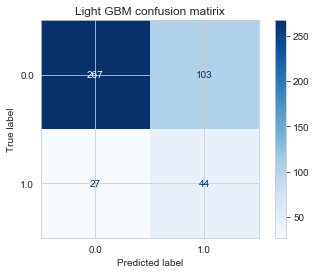

In [192]:
disp=plot_confusion_matrix(model_lgb, X_test, y_test, cmap=plt.cm.Blues, values_format=".3g")
disp.ax_.set_title("Light GBM confusion matirix")
plt.show()

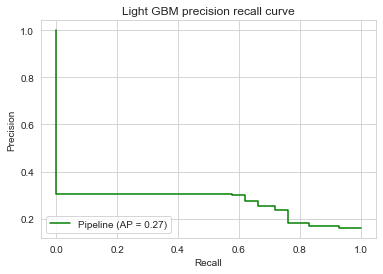

In [193]:
disp=plot_precision_recall_curve(model_lgb, X_test, y_test, color="g")
disp.ax_.set_title("Light GBM precision recall curve")
plt.show()

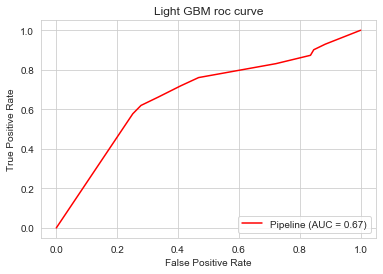

In [194]:
disp=plot_roc_curve(model_lgb, X_test, y_test, color="r")
disp.ax_.set_title("Light GBM roc curve")
plt.show()

### 10.8. CatBoost Classifier

In [195]:
from catboost import CatBoostClassifier

In [197]:
pipe_cat=Pipeline([
    ("feature_selection",SelectFromModel(estimator=LogisticRegression(penalty="l1", 
                                                                      solver='liblinear' ))),
    ("classifier", CatBoostClassifier(subsample=1))
])


bayes_cv_cat = BayesSearchCV(estimator =pipe_cat,
    search_spaces = {
        'classifier__iterations': Integer(10, 100),
        'classifier__depth': Integer(2, 15),
        'classifier__learning_rate': Real(0.001, 1),
        
        'classifier__bagging_temperature': Real(0.0, 1.0),
        'classifier__border_count': Integer(1, 100),
    
        'classifier__l2_leaf_reg': Integer(2, 10),
        'classifier__scale_pos_weight':Real(0.01, 1.0, 'uniform')
    },
    scoring = score_roc,
    cv = StratifiedKFold(
        n_splits=5,
        shuffle=True,
        random_state=42
    ),
    n_jobs = -1,
    n_iter = 20,
    n_points=5,
    verbose = 0,
    optimizer_kwargs={'base_estimator': 'GP'},
    refit = True,
    random_state = 42
)


print( "The number of iterations:", bayes_cv_cat.total_iterations)

The number of iterations: 140


In [198]:
bayes_cv_cat.fit(X_train, y_train)

bayes_cv_cat.best_score_

0:	learn: 0.4374039	total: 56.7ms	remaining: 511ms
1:	learn: 0.3836282	total: 58.4ms	remaining: 234ms
2:	learn: 0.3636613	total: 60.1ms	remaining: 140ms
3:	learn: 0.3351654	total: 61.8ms	remaining: 92.8ms
4:	learn: 0.3133511	total: 63.9ms	remaining: 63.9ms
5:	learn: 0.2999163	total: 66.4ms	remaining: 44.3ms
6:	learn: 0.2816189	total: 68.1ms	remaining: 29.2ms
7:	learn: 0.2719491	total: 69.8ms	remaining: 17.5ms
8:	learn: 0.2616474	total: 71.7ms	remaining: 7.96ms
9:	learn: 0.2549610	total: 73.4ms	remaining: 0us


0.6684546526737806

In [199]:
model_cat=bayes_cv_cat.best_estimator_

In [200]:
model_cat

Pipeline(memory=None,
         steps=[('feature_selection',
                 SelectFromModel(estimator=LogisticRegression(C=1.0,
                                                              class_weight=None,
                                                              dual=False,
                                                              fit_intercept=True,
                                                              intercept_scaling=1,
                                                              l1_ratio=None,
                                                              max_iter=100,
                                                              multi_class='auto',
                                                              n_jobs=None,
                                                              penalty='l1',
                                                              random_state=None,
                                                              solver='liblinear',
  

In [201]:
y_pred_cat=model_cat.predict(X_test)
print(classification_report(y_test,y_pred_cat))

              precision    recall  f1-score   support

         0.0       0.89      0.94      0.92       370
         1.0       0.58      0.42      0.49        71

    accuracy                           0.86       441
   macro avg       0.74      0.68      0.70       441
weighted avg       0.84      0.86      0.85       441



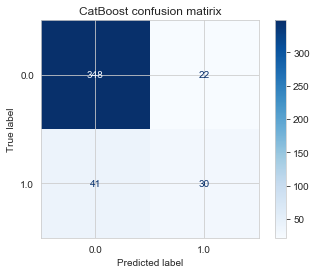

In [202]:
disp=plot_confusion_matrix(model_cat, X_test, y_test, cmap=plt.cm.Blues, values_format=".3g")
disp.ax_.set_title("CatBoost confusion matirix")
plt.show()

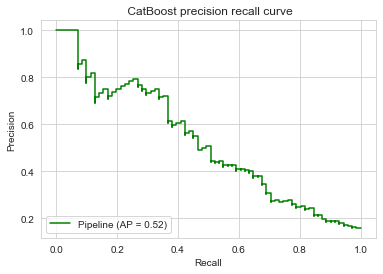

In [203]:
disp=plot_precision_recall_curve(model_cat, X_test, y_test, color="g")
disp.ax_.set_title(" CatBoost precision recall curve")
plt.show()

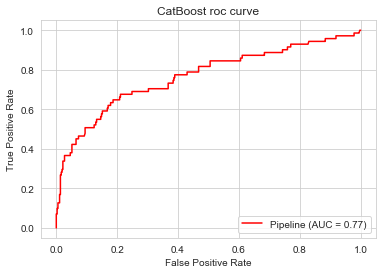

In [204]:
disp=plot_roc_curve(model_cat, X_test, y_test, color="r")
disp.ax_.set_title("CatBoost roc curve")
plt.show()

### 10. 9. AdaBoost Classifier

In [205]:
from sklearn.ensemble import AdaBoostClassifier

In [206]:
pipe_ada=Pipeline([
    ("feature_selection",SelectFromModel(estimator=RandomForestClassifier())),
    ("classifier", AdaBoostClassifier())
])


bayes_cv_ada = BayesSearchCV(estimator =pipe_ada,
    search_spaces = {
        'classifier__n_estimators': Integer(10, 200),
        'classifier__learning_rate': Real(0.001, 1)
    },
    scoring = score_roc,
    cv = StratifiedKFold(
        n_splits=5,
        shuffle=True,
        random_state=42
    ),
    n_jobs = -1,
    n_iter = 20, 
    n_points=5,
    verbose = 0,
    optimizer_kwargs={'base_estimator': 'GP'},
    refit = True,
    random_state = 42
)

print( "The number of iterations:", bayes_cv_ada.total_iterations)

The number of iterations: 40


In [207]:
bayes_cv_ada.fit(X_train, y_train)

bayes_cv_ada.best_score_

0.7007005119714985

In [208]:
model_ada=bayes_cv_ada.best_estimator_

In [209]:
model_ada

Pipeline(memory=None,
         steps=[('feature_selection',
                 SelectFromModel(estimator=RandomForestClassifier(bootstrap=True,
                                                                  ccp_alpha=0.0,
                                                                  class_weight=None,
                                                                  criterion='gini',
                                                                  max_depth=None,
                                                                  max_features='auto',
                                                                  max_leaf_nodes=None,
                                                                  max_samples=None,
                                                                  min_impurity_decrease=0.0,
                                                                  min_impurity_split=None,
                                                                  min_samples_leaf=1

In [210]:
y_pred_ada=model_ada.predict(X_test)
print(classification_report(y_test,y_pred_ada))

              precision    recall  f1-score   support

         0.0       0.89      0.94      0.92       370
         1.0       0.57      0.42      0.48        71

    accuracy                           0.85       441
   macro avg       0.73      0.68      0.70       441
weighted avg       0.84      0.85      0.85       441



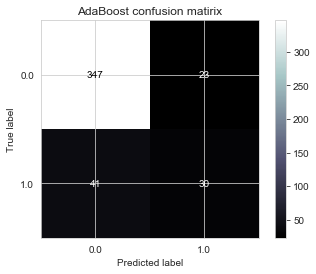

In [211]:
disp=plot_confusion_matrix(model_ada, X_test, y_test, cmap=plt.cm.bone, values_format=".3g")
disp.ax_.set_title("AdaBoost confusion matirix")
plt.show()

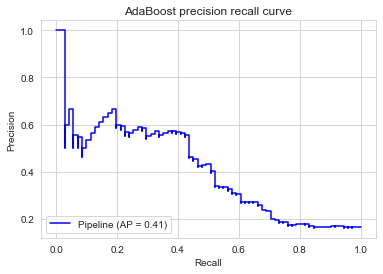

In [212]:
disp=plot_precision_recall_curve(model_ada, X_test, y_test, color="b")
disp.ax_.set_title("AdaBoost precision recall curve")
plt.show()

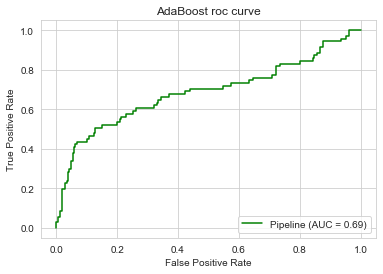

In [213]:
disp=plot_roc_curve(model_ada, X_test, y_test, color="g")
disp.ax_.set_title("AdaBoost roc curve")
plt.show()

### 10.10. Bagging Classifier

In [214]:
from sklearn.ensemble import BaggingClassifier

In [215]:
pipe_bag=Pipeline([
    ("feature_selection",SelectFromModel(XGBClassifier())),
    ("classifier", BaggingClassifier())
])


bayes_cv_bag = BayesSearchCV(estimator =pipe_bag,
    search_spaces = {
        'classifier__n_estimators': Integer(10, 100),
        'classifier__max_samples': Integer(2, 50)
    },
    scoring = score_roc,
    cv = StratifiedKFold(
        n_splits=5,
        shuffle=True,
        random_state=42
    ),
    n_jobs = -1,
    n_iter = 50,   
    verbose = 0,
    #optimizer_kwargs={'base_estimator': 'GP'},
    refit = True,
    random_state = 42
)


print( "The number of iterations:", bayes_cv_bag.total_iterations)

The number of iterations: 100


In [216]:
bayes_cv_bag.fit(X_train, y_train)

bayes_cv_bag.best_score_

0.5760505459276755

In [217]:
model_bag=bayes_cv_bag.best_estimator_

In [218]:
model_bag

Pipeline(memory=None,
         steps=[('feature_selection',
                 SelectFromModel(estimator=XGBClassifier(base_score=0.5,
                                                         booster='gbtree',
                                                         colsample_bylevel=1,
                                                         colsample_bynode=1,
                                                         colsample_bytree=1,
                                                         gamma=0,
                                                         learning_rate=0.1,
                                                         max_delta_step=0,
                                                         max_depth=3,
                                                         min_child_weight=1,
                                                         missing=None,
                                                         n_estimators=100,
                                                  

In [219]:
y_pred_bag=model_bag.predict(X_test)
print(classification_report(y_test,y_pred_bag))

              precision    recall  f1-score   support

         0.0       0.86      0.94      0.90       370
         1.0       0.36      0.17      0.23        71

    accuracy                           0.82       441
   macro avg       0.61      0.56      0.56       441
weighted avg       0.78      0.82      0.79       441



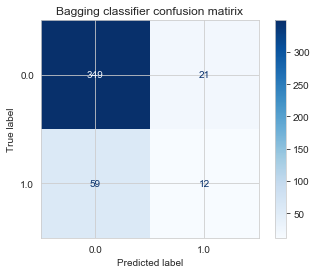

In [221]:
disp=plot_confusion_matrix(model_bag, X_test, y_test, cmap=plt.cm.Blues, values_format=".3g")
disp.ax_.set_title("Bagging classifier confusion matirix")
plt.show()

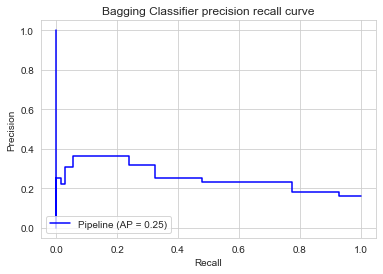

In [222]:
disp=plot_precision_recall_curve(model_bag, X_test, y_test, color="b")
disp.ax_.set_title("Bagging Classifier precision recall curve")
plt.show()

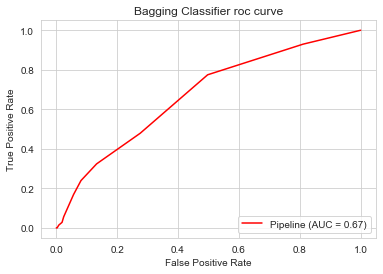

In [223]:
disp=plot_roc_curve(model_bag, X_test, y_test, color="r")
disp.ax_.set_title("Bagging Classifier roc curve")
plt.show()

### 10.11. RandomForest Classifier

In [224]:
pipe_rf=Pipeline([
    ("feature_selection",SelectFromModel(LGBMClassifier())),
    ("classifier", RandomForestClassifier())
])


bayes_cv_rf = BayesSearchCV(estimator =pipe_rf,
    search_spaces = {
        'classifier__n_estimators': Integer(10, 200),
        'classifier__min_samples_split': Integer(2, 5),
        'classifier__min_samples_leaf': Integer(1, 5),

        'classifier__criterion': Categorical(["gini", "entropy"]),
        'classifier__min_weight_fraction_leaf': Real(0, 0.5),
        'classifier__class_weight': Categorical(["balanced", "balanced_subsample", None])
    },
    scoring = score_f1,
    cv = StratifiedKFold(
        n_splits=5,
        shuffle=True,
        random_state=42
    ),
    n_jobs = -1,
    n_iter = 30, 
    n_points=5,
    verbose = 0,
    optimizer_kwargs={'base_estimator': 'GP'},
    refit = True,
    random_state = 42
)

print( "The number of iterations:", bayes_cv_rf.total_iterations)

The number of iterations: 180


In [225]:
bayes_cv_rf.fit(X_train, y_train)

bayes_cv_rf.best_score_

0.5457325582801896

In [226]:
model_rf=bayes_cv_rf.best_estimator_

In [227]:
model_rf

Pipeline(memory=None,
         steps=[('feature_selection',
                 SelectFromModel(estimator=LGBMClassifier(boosting_type='gbdt',
                                                          class_weight=None,
                                                          colsample_bytree=1.0,
                                                          importance_type='split',
                                                          learning_rate=0.1,
                                                          max_depth=-1,
                                                          min_child_samples=20,
                                                          min_child_weight=0.001,
                                                          min_split_gain=0.0,
                                                          n_estimators=100,
                                                          n_jobs=-1,
                                                          num_leaves=31,
             

In [228]:
y_pred_rf=model_rf.predict(X_test)
print(classification_report(y_test,y_pred_rf))

              precision    recall  f1-score   support

         0.0       0.89      0.92      0.91       370
         1.0       0.50      0.39      0.44        71

    accuracy                           0.84       441
   macro avg       0.69      0.66      0.67       441
weighted avg       0.83      0.84      0.83       441



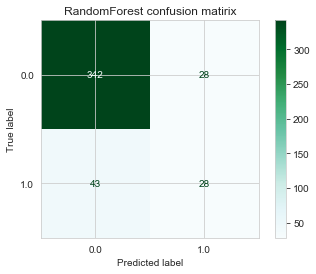

In [229]:
disp=plot_confusion_matrix(model_rf, X_test, y_test, cmap=plt.cm.BuGn, values_format=".3g")
disp.ax_.set_title("RandomForest confusion matirix")
plt.show()

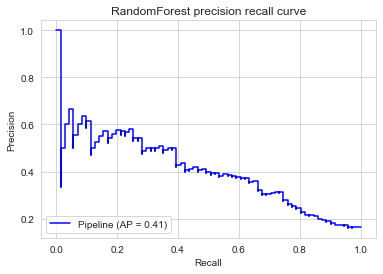

In [230]:
disp=plot_precision_recall_curve(model_rf, X_test, y_test, color="b")
disp.ax_.set_title("RandomForest precision recall curve")
plt.show()

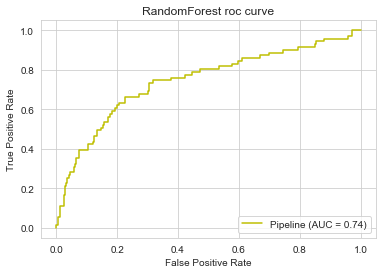

In [231]:
disp=plot_roc_curve(model_rf, X_test, y_test, color="y")
disp.ax_.set_title("RandomForest roc curve")
plt.show()

### 10.12. Stacking Classifier

In [232]:
from sklearn.ensemble import StackingClassifier

In [233]:
estimators = [('ada',AdaBoostClassifier()),
            ('xgb', XGBClassifier()),
             ("rf", RandomForestClassifier()),
              ("ext", ExtraTreeClassifier()),
              ("bagg", BaggingClassifier())
             ]

final_estimator=LGBMClassifier()

pipe_sc=Pipeline([
    #("feature_selection",SelectFromModel(LGBMClassifier())),
    ("classifier", StackingClassifier(estimators =estimators, final_estimator=final_estimator))
])


bayes_cv_sc = BayesSearchCV(estimator =pipe_sc,
    search_spaces = {
        'classifier__stack_method': Categorical(['auto', 'predict'])
    },
    scoring = score_roc,
    cv = StratifiedKFold(
        n_splits=5,
        shuffle=True,
        random_state=42
    ),
    n_jobs = -1,
    n_iter = 20,   
    verbose = 0,
    optimizer_kwargs={'base_estimator': 'GP'},
    refit = True,
    random_state = 42
)

print( "The number of iterations:", bayes_cv_sc.total_iterations)

The number of iterations: 20


In [234]:
bayes_cv_sc.fit(X_train, y_train)

bayes_cv_sc.best_score_

0.7388921864895477

In [235]:
model_sc=bayes_cv_sc.best_estimator_

In [236]:
y_pred_sc=model_sc.predict(X_test)
print(classification_report(y_test,y_pred_sc))

              precision    recall  f1-score   support

         0.0       0.89      0.91      0.90       370
         1.0       0.47      0.39      0.43        71

    accuracy                           0.83       441
   macro avg       0.68      0.65      0.66       441
weighted avg       0.82      0.83      0.82       441



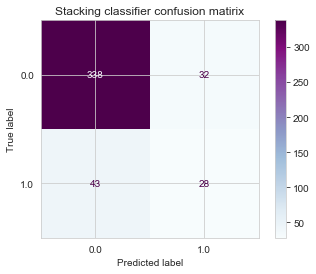

In [237]:
disp=plot_confusion_matrix(model_sc, X_test, y_test, cmap=plt.cm.BuPu, values_format=".3g")
disp.ax_.set_title("Stacking classifier confusion matirix")
plt.show()

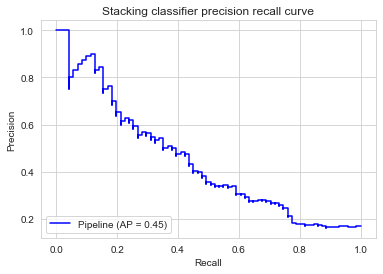

In [238]:
disp=plot_precision_recall_curve(model_sc, X_test, y_test, color="b")
disp.ax_.set_title("Stacking classifier precision recall curve")
plt.show()

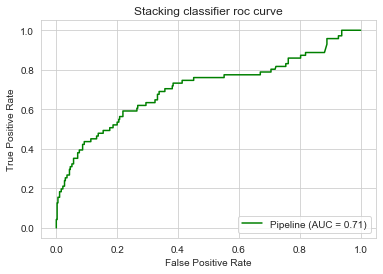

In [239]:
disp=plot_roc_curve(model_sc, X_test, y_test, color="g")
disp.ax_.set_title("Stacking classifier roc curve")
plt.show()

### 10.12. Voting Classifier

In [240]:
from sklearn.ensemble import VotingClassifier

In [241]:
estimators = [('ada',AdaBoostClassifier()),
            ('xgb', XGBClassifier()),
             ("rf", RandomForestClassifier()),
              ("lgb", LGBMClassifier()),
              ("bagg", BaggingClassifier())
             ]

pipe_vo=Pipeline([
    ("feature_selection",SelectFromModel(LGBMClassifier())),
    ("classifier", VotingClassifier(estimators =estimators))
])


bayes_cv_vo = BayesSearchCV(estimator =pipe_vo,
      search_spaces = {
        'classifier__voting': Categorical(['hard', 'soft'])},
    scoring = score_roc,
    cv = StratifiedKFold(
        n_splits=5,
        shuffle=True,
        random_state=42
    ),
    n_jobs = -1,
    n_iter = 20,   
    verbose = 0,
    optimizer_kwargs={'base_estimator': 'GP'},
    refit = True,
    random_state = 42
)

print( "The number of iterations:", bayes_cv_vo.total_iterations)

The number of iterations: 20


In [242]:
bayes_cv_vo.fit(X_train, y_train)

bayes_cv_vo.best_score_

0.6618649076242142

In [243]:
model_vo=bayes_cv_vo.best_estimator_

In [244]:
y_pred_vo=model_vo.predict(X_test)

print(classification_report(y_test,y_pred_vo))

              precision    recall  f1-score   support

         0.0       0.88      0.96      0.92       370
         1.0       0.61      0.28      0.38        71

    accuracy                           0.85       441
   macro avg       0.74      0.62      0.65       441
weighted avg       0.83      0.85      0.83       441



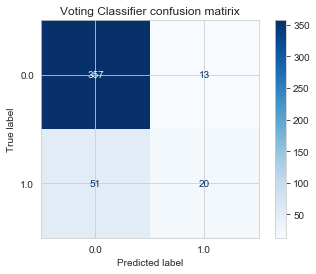

In [247]:
disp=plot_confusion_matrix(model_vo, X_test, y_test, cmap=plt.cm.Blues, values_format=".3g")
disp.ax_.set_title("Voting Classifier confusion matirix")
plt.show()

### 10.13. Gaussian Naive Bayes (GaussianNB)

In [248]:
from sklearn.naive_bayes import GaussianNB

In [250]:
pipe_gnb=Pipeline([
    ("feature_selection",SelectKBest()),
    ("classifier", GaussianNB())
])


bayes_cv_gnb = BayesSearchCV(estimator =pipe_gnb,
      search_spaces = {
        'classifier__var_smoothing': Real(1e-10, 1),
        "feature_selection__k": Integer(10,50)
      },
    scoring = score_f1,
    cv = StratifiedKFold(
        n_splits=5,
        shuffle=True,
        random_state=42
    ),
    n_jobs = -1,
    n_iter = 30,   
    verbose = 0,
    optimizer_kwargs={'base_estimator': 'GP'},
    refit = True,
    random_state = 42
)

print( "The number of iterations:", bayes_cv_gnb.total_iterations)

The number of iterations: 60


In [251]:
bayes_cv_gnb.fit(X_train, y_train)

bayes_cv_gnb.best_score_

0.4951641732064386

In [252]:
model_gnb=bayes_cv_gnb.best_estimator_

In [253]:
y_pred_gnb=model_gnb.predict(X_test)

print(classification_report(y_test,y_pred_gnb))

              precision    recall  f1-score   support

         0.0       0.92      0.84      0.88       370
         1.0       0.43      0.63      0.51        71

    accuracy                           0.81       441
   macro avg       0.68      0.74      0.70       441
weighted avg       0.84      0.81      0.82       441



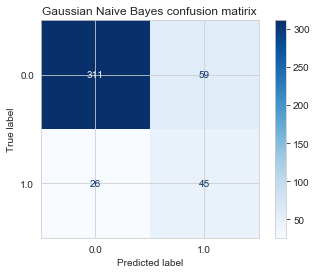

In [254]:
disp=plot_confusion_matrix(model_gnb, X_test, y_test, cmap=plt.cm.Blues, values_format=".3g")
disp.ax_.set_title("Gaussian Naive Bayes confusion matirix")
plt.show()

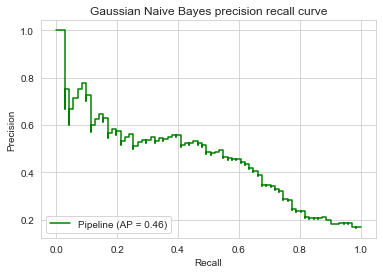

In [255]:
disp=plot_precision_recall_curve(model_gnb, X_test, y_test, color="g")
disp.ax_.set_title("Gaussian Naive Bayes precision recall curve")
plt.show()

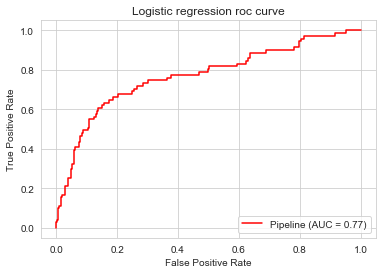

In [256]:
disp=plot_roc_curve(model_gnb, X_test, y_test, color="r")
disp.ax_.set_title("Gaussian Naive Bayes roc curve")
plt.show()

### 10.14. Gaussian Process Classifier

In [257]:
from sklearn.gaussian_process import GaussianProcessClassifier

In [258]:
pipe_gpc=Pipeline([
    ("feature_selection",SelectKBest()),
    ("classifier", GaussianProcessClassifier())
])


bayes_cv_gpc = BayesSearchCV(estimator =pipe_gpc,
      search_spaces = {
        'classifier__max_iter_predict': Integer(10, 100),
        'classifier__n_restarts_optimizer': Integer(0, 50),
          
        "feature_selection__k": Integer(5,50)
          
      },
    scoring = score_f1,
    cv = StratifiedKFold(
        n_splits=5,
        shuffle=True,
        random_state=42
    ),
    n_jobs = -1,
    n_iter = 20,   
    verbose = 0,
    optimizer_kwargs={'base_estimator': 'GP'},
    refit = True,
    random_state = 42
)


print( "The number of iterations:", bayes_cv_gpc.total_iterations)

The number of iterations: 60


In [259]:
bayes_cv_gpc.fit(X_train, y_train)

bayes_cv_gpc.best_score_

0.37977970499118197

In [260]:
model_gpc=bayes_cv_gpc.best_estimator_

In [261]:
model_gpc

Pipeline(memory=None,
         steps=[('feature_selection',
                 SelectKBest(k=7,
                             score_func=<function f_classif at 0x00000159B013A5E8>)),
                ('classifier',
                 GaussianProcessClassifier(copy_X_train=True, kernel=None,
                                           max_iter_predict=23,
                                           multi_class='one_vs_rest',
                                           n_jobs=None, n_restarts_optimizer=1,
                                           optimizer='fmin_l_bfgs_b',
                                           random_state=None,
                                           warm_start=False))],
         verbose=False)

In [262]:
y_pred_gpc=model_gpc.predict(X_test)

print(classification_report(y_test,y_pred_gpc))

              precision    recall  f1-score   support

         0.0       0.87      0.96      0.91       370
         1.0       0.52      0.23      0.31        71

    accuracy                           0.84       441
   macro avg       0.69      0.59      0.61       441
weighted avg       0.81      0.84      0.81       441



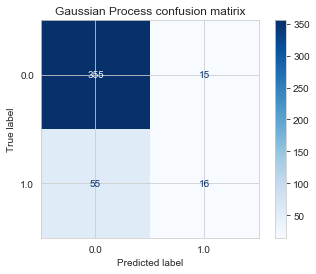

In [263]:
disp=plot_confusion_matrix(model_gpc, X_test, y_test, cmap=plt.cm.Blues, values_format=".3g")
disp.ax_.set_title("Gaussian Process confusion matirix")
plt.show()

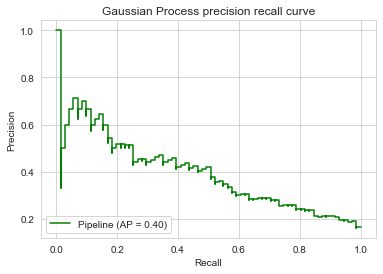

In [264]:
disp=plot_precision_recall_curve(model_gpc, X_test, y_test, color="g")
disp.ax_.set_title("Gaussian Process precision recall curve")
plt.show()

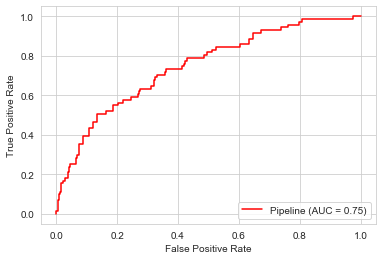

In [265]:
plot_roc_curve(model_gpc, X_test, y_test, color="r")
disp.ax_.set_title("Gaussian Process roc curve")
plt.show()

### 10.15. Ridge Classifier

In [266]:
from sklearn.linear_model import RidgeClassifier

In [267]:
pipe_kr=Pipeline([
    ("feature_selection",SelectKBest()),
    ("classifier", RidgeClassifier())
])


bayes_cv_kr = BayesSearchCV(estimator =pipe_kr,
      search_spaces = {
        'classifier__alpha': Real(1, 5),
        'classifier__class_weight': Categorical(['balanced', None]),
        'classifier__tol': Real(0.01, 10),
        'classifier__max_iter': Integer(1, 50),
          
        "feature_selection__k": Integer(10,70)
          
      },
    scoring = score_roc,
    cv = StratifiedKFold(
        n_splits=5,
        shuffle=True,
        random_state=42
    ),
    n_jobs = -1,
    n_iter = 50,   
    verbose = 0,
    optimizer_kwargs={'base_estimator': 'GP'},
    refit = True,
    random_state = 42
)

print( "The number of iterations:", bayes_cv_kr.total_iterations)

The number of iterations: 250


In [268]:
bayes_cv_kr.fit(X_train, y_train)

bayes_cv_kr.best_score_

0.7889590006214583

In [269]:
model_kr=bayes_cv_kr.best_estimator_

In [270]:
model_kr

Pipeline(memory=None,
         steps=[('feature_selection',
                 SelectKBest(k=55,
                             score_func=<function f_classif at 0x00000159B013A5E8>)),
                ('classifier',
                 RidgeClassifier(alpha=1.1387331084613046,
                                 class_weight='balanced', copy_X=True,
                                 fit_intercept=True, max_iter=48,
                                 normalize=False, random_state=None,
                                 solver='auto', tol=0.1279832953688508))],
         verbose=False)

In [271]:
y_pred_kr=model_kr.predict(X_test)

print(classification_report(y_test,y_pred_kr))

              precision    recall  f1-score   support

         0.0       0.93      0.80      0.86       370
         1.0       0.41      0.70      0.52        71

    accuracy                           0.79       441
   macro avg       0.67      0.75      0.69       441
weighted avg       0.85      0.79      0.81       441



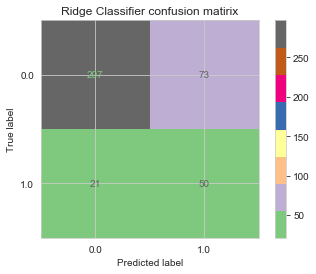

In [274]:
disp=plot_confusion_matrix(model_kr, X_test, y_test, cmap=plt.cm.Accent, values_format=".3g")
disp.ax_.set_title("Ridge Classifier confusion matirix")
plt.show()

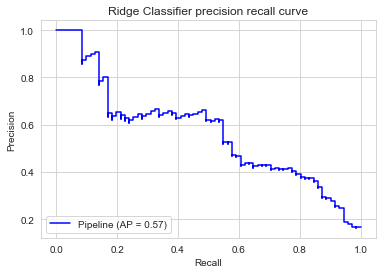

In [275]:
disp=plot_precision_recall_curve(model_kr, X_test, y_test, color="b")
disp.ax_.set_title("Ridge Classifier precision recall curve")
plt.show()

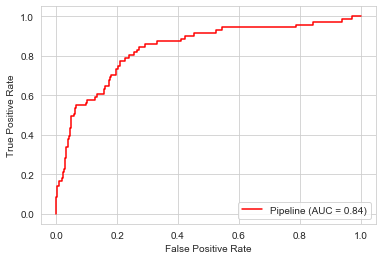

In [276]:
plot_roc_curve(model_kr, X_test, y_test, color="r")
disp.ax_.set_title("Ridge Classifier roc curve")
plt.show()

### 10.16. Decision Tree Classifier

In [277]:
from sklearn.tree import DecisionTreeClassifier

In [278]:
pipe_dt=Pipeline([
    ("feature_selection",SelectKBest()),
    ("classifier", DecisionTreeClassifier())
])


bayes_cv_dt = BayesSearchCV(estimator =pipe_dt,
      search_spaces = {
      
    "classifier__criterion":Categorical(["gini", "entropy"]), 
    "classifier__splitter":Categorical(["best", "random"]), 
    "classifier__max_depth":Integer(1, 40), 
    "classifier__min_samples_split":Integer(2,5), 
    "classifier__min_samples_leaf":Integer(1, 10),
          
     "feature_selection__k": Integer(10,70)
          
          
          
      },
    scoring = score_roc,
    cv = StratifiedKFold(
        n_splits=5,
        shuffle=True,
        random_state=42
    ),
    n_jobs = -1,
    n_iter = 50,   
    verbose = 0,
    optimizer_kwargs={'base_estimator': 'GP'},
    refit = True,
    random_state = 42
)

print( "The number of iterations:", bayes_cv_dt.total_iterations)

The number of iterations: 300


In [279]:
bayes_cv_dt.fit(X_train, y_train)

bayes_cv_dt.best_score_

0.6775311719244058

In [280]:
model_dt=bayes_cv_dt.best_estimator_

In [282]:
y_pred_dt=model_dt.predict(X_test)

print(classification_report(y_test,y_pred_dt))

              precision    recall  f1-score   support

         0.0       0.87      0.93      0.90       370
         1.0       0.43      0.28      0.34        71

    accuracy                           0.83       441
   macro avg       0.65      0.61      0.62       441
weighted avg       0.80      0.83      0.81       441



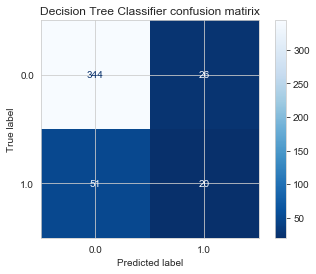

In [283]:
disp=plot_confusion_matrix(model_dt, X_test, y_test, cmap=plt.cm.Blues_r, values_format=".3g")
disp.ax_.set_title("Decision Tree Classifier confusion matirix")
plt.show()

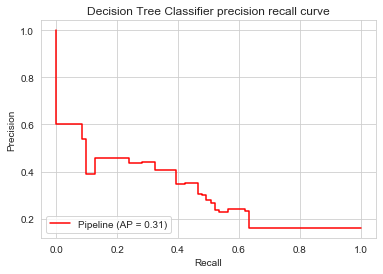

In [284]:
disp=plot_precision_recall_curve(model_dt, X_test, y_test, color="r")
disp.ax_.set_title("Decision Tree Classifier precision recall curve")
plt.show()

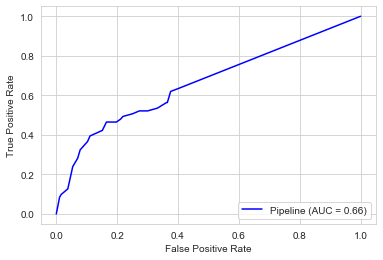

In [285]:
plot_roc_curve(model_dt, X_test, y_test, color="b")
disp.ax_.set_title("Decision Tree Classifier roc curve")
plt.show()

### 10.17. KNeighbors Classifier

In [286]:
from sklearn.neighbors import KNeighborsClassifier

In [287]:
pipe_knn=Pipeline([
    ("feature_selection",SelectKBest()),
    ("classifier", KNeighborsClassifier())
])


bayes_cv_knn = BayesSearchCV(estimator =pipe_knn,
      search_spaces = {
        'classifier__n_neighbors': Integer(3, 10),
        'classifier__weights': Categorical(['uniform', 'distance']),
        'classifier__leaf_size': Integer(1, 30),
          
        "feature_selection__k": Integer(10,70)
          
      },
    scoring = score_roc,
    cv = StratifiedKFold(
        n_splits=5,
        shuffle=True,
        random_state=42
    ),
    n_jobs = -1,
    n_iter = 50,   
    verbose = 0,
    optimizer_kwargs={'base_estimator': 'GP'},
    refit = True,
    random_state = 42
)

print( "The number of iterations:", bayes_cv_knn.total_iterations)

The number of iterations: 200


In [288]:
bayes_cv_knn.fit(X_train, y_train)

bayes_cv_knn.best_score_

0.6432282339795298

In [289]:
model_knn=bayes_cv_knn.best_estimator_

In [290]:
model_knn

Pipeline(memory=None,
         steps=[('feature_selection',
                 SelectKBest(k=10,
                             score_func=<function f_classif at 0x00000159B013A5E8>)),
                ('classifier',
                 KNeighborsClassifier(algorithm='auto', leaf_size=1,
                                      metric='minkowski', metric_params=None,
                                      n_jobs=None, n_neighbors=3, p=2,
                                      weights='uniform'))],
         verbose=False)

In [291]:
y_pred_knn=model_knn.predict(X_test)

print(classification_report(y_test,y_pred_knn))

              precision    recall  f1-score   support

         0.0       0.88      0.92      0.90       370
         1.0       0.45      0.35      0.39        71

    accuracy                           0.83       441
   macro avg       0.66      0.63      0.65       441
weighted avg       0.81      0.83      0.82       441



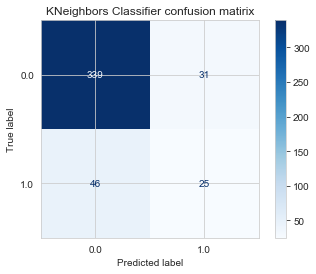

In [292]:
disp=plot_confusion_matrix(model_knn, X_test, y_test, cmap=plt.cm.Blues, values_format=".3g")
disp.ax_.set_title("KNeighbors Classifier confusion matirix")
plt.show()

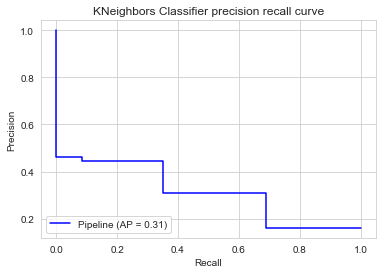

In [293]:
disp=plot_precision_recall_curve(model_knn, X_test, y_test, color="b")
disp.ax_.set_title("KNeighbors Classifier precision recall curve")
plt.show()

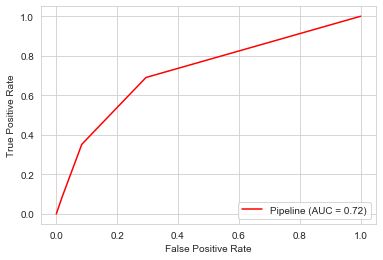

In [294]:
plot_roc_curve(model_knn, X_test, y_test, color="r")
disp.ax_.set_title("KNeighbors Classifier roc curve")
plt.show()